---
## Importing Feature Vectors 

---

In [1]:
import pickle
import numpy as np
import pandas as pd
# Load data for features_dict_vision
file_path = '/Users/rishabhdubey/Downloads/Project/Feature Vectors/16th/features_dict_vision_leg_aug.pkl'
with open(file_path, 'rb') as pickle_file:
    features_dict_vision = pickle.load(pickle_file)

# Load data for features_dict_vision_val
file_path = '/Users/rishabhdubey/Downloads/Project/Feature Vectors/16th/features_dict_vision_val_leg_aug.pkl'
with open(file_path, 'rb') as pickle_file:
    features_dict_vision_val = pickle.load(pickle_file)

# Load data for features_dict_vision_test
file_path = '/Users/rishabhdubey/Downloads/Project/Feature Vectors/16th/features_dict_vision_test_leg_aug.pkl'
with open(file_path, 'rb') as pickle_file:
    features_dict_vision_test = pickle.load(pickle_file)
    
training = list(set(features_dict_vision.keys()))
print(len(training))
validating = list(set(features_dict_vision_val.keys()))
print(len(validating))
testing = list(set(features_dict_vision_test.keys()))
print(len(testing))

21590
57
57


---
Setting Filepaths

---

In [2]:
# Input and output folders
input_folder = '/Users/rishabhdubey/Downloads/FracAtlas/images/BothComplete'
synthetic_folder = '/Users/rishabhdubey/Downloads/Project/Output_Synth_new_1_aug'
masked_synthetic_folder = '/Users/rishabhdubey/Downloads/Project/Masked_Synth_new_1_aug'
additional_folder = '/Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug'
json_path = '/Users/rishabhdubey/Downloads/Project/coordinates_and_rotations_1_aug.json'
file_path_csv = '/Users/rishabhdubey/Downloads/FracAtlas/dataset.csv'
max_nu_of_splits = 3
original_folder = '/Users/rishabhdubey/Downloads/BothComplete'
masked_synthetic_folder = additional_folder

---
Importing Libraries

---

In [3]:
import os
import random
import cv2
import numpy as np
import json
from tqdm.notebook import tqdm
import tensorflow as tf
from tensorflow.keras.layers import Dense, Input, BatchNormalization, LeakyReLU, Conv1D, Flatten, Reshape, Lambda, Concatenate, MultiHeadAttention, LayerNormalization, Add, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')
import keras_tuner as kt
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from transformers import ViTImageProcessor, ViTModel
import torch
from copy import deepcopy
import pickle
import cv2 as cv
from itertools import permutations


---
Importing the Json Object Containing Labels for the Image Data

---


In [4]:

# Open and read the JSON file
with open(json_path, 'r') as file:
    coordinates_and_rotations = json.load(file)

In [5]:
len(coordinates_and_rotations)

38000

In [6]:
for item in coordinates_and_rotations[8:12]:
    filename = item['filename']
    centers = [(split['x_center'], split['y_center']) for split in item['splits']]
    rotations = [split['rotation'] for split in item['splits']]
    
    print(f"Image: {filename}")
    for i, (center, rotation) in enumerate(zip(centers, rotations), start=1):
        print(f"Center {i}: {center}")



Image: 9_IMG0001600.jpg
Center 1: (82, 234)
Center 2: (243, 278)
Center 3: (417, 234)
Image: 10_IMG0001600.jpg
Center 1: (64, 270)
Center 2: (226, 262)
Center 3: (418, 258)
Image: 1_IMG0002309.jpg
Center 1: (86, 279)
Center 2: (269, 278)
Center 3: (439, 245)
Image: 2_IMG0002309.jpg
Center 1: (62, 248)
Center 2: (251, 239)
Center 3: (444, 269)


In [7]:
coordinates_and_rotations[0]

{'filename': '1_IMG0001600.jpg',
 'splits': [{'x_center': 63, 'y_center': 239, 'rotation': 7.861907982141766},
  {'x_center': 251, 'y_center': 240, 'rotation': 9.635172240330569},
  {'x_center': 443, 'y_center': 272, 'rotation': -1.5213890558178882}],
 'used_threshold': 90}

In [8]:

coordinates_d = {}

# Populate dict with coordinates
for item in coordinates_and_rotations:
    filename = item['filename']
    # Extract the (x, y) coordinates and convert them to int
    coordinates = [(int(split['x_center']), int(split['y_center'])) for split in item['splits']]
    coordinates_d[filename] = coordinates
    
images = []
for i in coordinates_d.keys():
    images.append(i)
    
img = [image.split('_',1)[1] for image in images]
img = set(img)
    
# the dictionary to store the rotations
rotations_d = {}

# Populate dictionary with coordinates
for item in coordinates_and_rotations:
    filename = item['filename']
    # Extract the (x, y) coordinates and convert them to integers
    rotations = [int(split['rotation']) for split in item['splits']]
    rotations_d[filename] = rotations

len(rotations_d)


38000

---
### Filtering dataset for using only Leg X-Rays
---

In [9]:
# Read CSV file
df = pd.read_csv(file_path_csv)
df.head()
columns = df.columns 
columns

Index(['image_id', 'hand', 'leg', 'hip', 'shoulder', 'mixed', 'hardware',
       'multiscan', 'fractured', 'fracture_count', 'frontal', 'lateral',
       'oblique'],
      dtype='object')

In [10]:
df[df['image_id'] == 'IMG0000823.jpg']

,image_id,hand,leg,hip,shoulder,mixed,hardware,multiscan,fractured,fracture_count,frontal,lateral,oblique
814,IMG0000823.jpg,1,0,0,0,0,0,0,0,0,1,0,0


In [11]:
lists = {col: df[df[col] == 1]['image_id'].tolist() for col in columns}
img_hand = list( (set(lists['hand'])))
img_leg = list( (set(lists['leg'])))

len(img_leg)

2273

In [12]:
training_hand_extracted = list(features_dict_vision.keys())
print(len(training_hand_extracted))

training_hand_extracted_ = []
for i in training_hand_extracted:
    training_hand_extracted_.append(i.split('_',1)[1])
    
training_hand_extracted = set(training_hand_extracted_)
print(len(training_hand_extracted))

x = True
for i in  training_hand_extracted:
    if i not in img_leg:
        x = False
        break
        
print(x)

21590
2159
True


---
# Preprocessing Labels and Feature Vectors for GRU and Regression Models
---
Functions for preprocessing the augmented data labels for the Traninig models

---

In [13]:
def ensure_coordinates(coordinates):
    while len(coordinates) < max_nu_of_splits:
        coordinates.append((-999, -999))
    return coordinates[:max_nu_of_splits]


def ensure_rotations(rotations):
    while len(rotations) < max_nu_of_splits:
        rotations.append(-999)
    return rotations[:max_nu_of_splits]


def calculate_number_of_splits(rotations):
    return max_nu_of_splits - rotations.count(-999)


# create the label column and the feature vector column
def create_label_and_feature(row):
    # Extract coordinates and rotations
    coordinates = [row[f'coordinates{i}'] for i in range(1, max_nu_of_splits+1)]
    rotations = [row[f'rotation{i}'] for i in range(1, max_nu_of_splits+1)]

    # flat the coordinates list and concatenate with rotations to form  label
    labels = [coord for sublist in coordinates for coord in sublist] + rotations

    # Concatenate the feature vectors into a single 2048-dimensional vector
    feature_vector = np.concatenate([row[f'featurevector{i}'] for i in range(1, max_nu_of_splits+1)])

    return pd.Series([labels, feature_vector])

def select_coordinate(row):
    if row['number'] == 1:
        return row['coordinates1']
    elif row['number'] == 2:
        return row['coordinates2']
    elif row['number'] == 3:
        return row['coordinates3']



def normalize_labels(labels):
    normalized_labels = []
    for i, value in enumerate(labels):
        if value == -999:
            normalized_labels.append(value)
        elif i < 6:
            normalized_labels.append(value / 512.0)
        else:
            normalized_labels.append(value / 10.0)
    return normalized_labels



def subtract_relative_coordinate(row):
    coord = row['relative_coordinate']

    # Compute the differences
    row['coordinates1'] = (row['coordinates1'][0] - coord[0], row['coordinates1'][1]- coord[1])
    row['coordinates2'] = (row['coordinates2'][0] - coord[0], row['coordinates2'][1]-  coord[1])
    row['coordinates3'] = (row['coordinates3'][0] - coord[0], row['coordinates3'][1]-  coord[1])

    return row



selected_columns = [
    'imagename', 'number_of_splits',
    'coordinates1', 'coordinates2', 'coordinates3',
    'rotation1', 'rotation2', 'rotation3',
    'featurevector1', 'featurevector2', 'featurevector3'
]

---
Using Training , validation and Test feature vectors and labels of the split images to Create Dataframes for Data Operations

---

In [14]:
import numpy as np

# 768x3 matrices
image_feature_matrices_vision_test = {}

for filename, features in features_dict_vision_test.items():
    # Padding with Zero
    feature_matrix = np.zeros((768, max_nu_of_splits))

    # matrix with feature vectors
    for idx, feature_vector in enumerate(features):
        feature_matrix[:, idx] = feature_vector

    image_feature_matrices_vision_test[filename] = feature_matrix

# ex First image in dict
first_image_key = list(image_feature_matrices_vision_test.keys())[0]
print(f"Feature matrix for {first_image_key}:")
print(image_feature_matrices_vision_test[first_image_key])


Feature matrix for IMG0000278.jpg:
[[ 8.15414041e-02 -2.28880905e-04  6.51981980e-02]
 [-3.03227723e-01 -4.80376221e-02 -5.31097241e-02]
 [-1.10399939e-01 -3.16208839e-01 -1.79584861e-01]
 ...
 [ 9.50372368e-02  1.97697841e-02  1.48425654e-01]
 [-6.15305677e-02  1.17927343e-01  1.62280425e-01]
 [ 1.10390082e-01 -1.65555522e-01 -1.70375749e-01]]


In [15]:
import numpy as np

# 768x4 matrices
image_feature_matrices_vision_val = {}

for filename, features in features_dict_vision_val.items():
    # Padding with Zero
    feature_matrix = np.zeros((768, max_nu_of_splits))

    # matrix with feature vectors
    for idx, feature_vector in enumerate(features):
        feature_matrix[:, idx] = feature_vector

    image_feature_matrices_vision_val[filename] = feature_matrix

# ex of First image in dict
first_image_key = list(image_feature_matrices_vision_val.keys())[0]
print(f"Feature matrix for {first_image_key}:")
print(image_feature_matrices_vision_val[first_image_key])


Feature matrix for IMG0002453.jpg:
[[ 0.04002022  0.05668973  0.08662197]
 [-0.02860215 -0.01111736  0.12913151]
 [-0.19158301 -0.28855208 -0.08626263]
 ...
 [ 0.03535168  0.02685269  0.20763929]
 [ 0.0955036   0.17711677  0.1999578 ]
 [-0.08507602 -0.11494835  0.16011986]]


In [16]:
data = []

for imagename in image_feature_matrices_vision_test.keys():
    row = {}
    row['imagename'] = imagename
    
    # Get coordinates and rotations
    coordinates = coordinates_d.get('6_'+imagename, [])
    rotations = rotations_d.get('6_'+imagename, [])
    
    # Ensure there are exactly required coordinates and rotations
    coordinates = ensure_coordinates(coordinates)
    rotations = ensure_rotations(rotations)
    

    number_of_splits = calculate_number_of_splits(rotations)
    

    for i in range(max_nu_of_splits):
        row[f'coordinates{i+1}'] = coordinates[i]
        row[f'rotation{i+1}'] = rotations[i]
    
    row['number_of_splits'] = number_of_splits
    
    final_matrix = image_feature_matrices_vision_test[imagename]
    for i in range(final_matrix.shape[1]):
        row[f'featurevector{i+1}'] = final_matrix[:, i].tolist()
    
    data.append(row)

test_df_vision = pd.DataFrame(data)
test_df_vision.shape

(57, 11)

In [17]:
test_df_vision.head()

,imagename,coordinates1,rotation1,coordinates2,rotation2,coordinates3,rotation3,number_of_splits,featurevector1,featurevector2,featurevector3
0,IMG0000278.jpg,"(89, 275)",3,"(239, 271)",-5,"(406, 242)",5,3,"[0.08154140412807465, -0.3032277226448059, -0....","[-0.00022888090461492538, -0.04803762212395668...","[0.06519819796085358, -0.05310972407460213, -0..."
1,IMG0000898.jpg,"(103, 270)",-1,"(250, 246)",3,"(403, 233)",8,3,"[0.26271793246269226, -0.21562522649765015, -0...","[-0.09107939898967743, -0.23294208943843842, -...","[0.06745678186416626, -0.038417670875787735, -..."
2,IMG0003822.jpg,"(79, 253)",3,"(226, 237)",-5,"(403, 234)",7,3,"[0.020239003002643585, -0.14512112736701965, 0...","[0.009090878069400787, -0.2132616937160492, -0...","[0.02021517977118492, -0.18915297091007233, -0..."
3,IMG0003228.jpg,"(89, 238)",0,"(245, 243)",-1,"(411, 246)",-8,3,"[-0.014993442222476006, -0.03321302682161331, ...","[-0.12655571103096008, -0.001028561033308506, ...","[0.10372114181518555, -0.13242360949516296, -0..."
4,IMG0000709.jpg,"(64, 271)",8,"(209, 257)",-5,"(401, 249)",6,3,"[-0.07226704061031342, 0.029334452003240585, 0...","[0.023486554622650146, -0.03326297923922539, -...","[0.10446611046791077, -0.057197205722332, -0.2..."


In [18]:
data = []

for imagename in image_feature_matrices_vision_val.keys():
    row = {}
    row['imagename'] = imagename
    
    # Get coordinates and rotations
    coordinates = coordinates_d.get('6_'+imagename, [])
    rotations = rotations_d.get('6_'+imagename, [])
    
    # Ensuring there are exactly required coordinates and rotations
    coordinates = ensure_coordinates(coordinates)
    rotations = ensure_rotations(rotations)
    
    number_of_splits = calculate_number_of_splits(rotations)

    for i in range(max_nu_of_splits):
        row[f'coordinates{i+1}'] = coordinates[i]
        row[f'rotation{i+1}'] = rotations[i]

    row['number_of_splits'] = number_of_splits

    final_matrix = image_feature_matrices_vision_val[imagename]
    for i in range(final_matrix.shape[1]):
        row[f'featurevector{i+1}'] = final_matrix[:, i].tolist()
    
    data.append(row)

validation_df_vision = pd.DataFrame(data)
validation_df_vision.shape

(57, 11)

In [19]:
import random

# to shuffle coordinates, rotations, and feature vectors within a row (for GRU model to train on this dataset)
def shuffle_row_once(row):
    # Determine the number of splits for the current row
    max_nu_of_splits = row['number_of_splits']

    # Extract the values for coordinates, rotations, and feature vectors
    feature_vectors = [row[f'featurevector{i}'] for i in range(1, max_nu_of_splits+1)]
    coordinates = [row[f'coordinates{i}'] for i in range(1, max_nu_of_splits+1)]
    rotations = [row[f'rotation{i}'] for i in range(1, max_nu_of_splits+1)]

    # Shuffle indices
    indices = list(range(max_nu_of_splits))
    random.shuffle(indices)

    for i, idx in enumerate(indices):
        row[f'featurevector{i+1}'] = feature_vectors[idx]
        row[f'coordinates{i+1}'] = coordinates[idx]
        row[f'rotation{i+1}'] = rotations[idx]

    return row

test_df_vision_shuffled = test_df_vision.apply(shuffle_row_once, axis=1)
validation_df_vision_shuffled = validation_df_vision.apply(shuffle_row_once, axis=1)

In [20]:
test_df_vision.head()

,imagename,coordinates1,rotation1,coordinates2,rotation2,coordinates3,rotation3,number_of_splits,featurevector1,featurevector2,featurevector3
0,IMG0000278.jpg,"(89, 275)",3,"(239, 271)",-5,"(406, 242)",5,3,"[0.08154140412807465, -0.3032277226448059, -0....","[-0.00022888090461492538, -0.04803762212395668...","[0.06519819796085358, -0.05310972407460213, -0..."
1,IMG0000898.jpg,"(103, 270)",-1,"(250, 246)",3,"(403, 233)",8,3,"[0.26271793246269226, -0.21562522649765015, -0...","[-0.09107939898967743, -0.23294208943843842, -...","[0.06745678186416626, -0.038417670875787735, -..."
2,IMG0003822.jpg,"(79, 253)",3,"(226, 237)",-5,"(403, 234)",7,3,"[0.020239003002643585, -0.14512112736701965, 0...","[0.009090878069400787, -0.2132616937160492, -0...","[0.02021517977118492, -0.18915297091007233, -0..."
3,IMG0003228.jpg,"(89, 238)",0,"(245, 243)",-1,"(411, 246)",-8,3,"[-0.014993442222476006, -0.03321302682161331, ...","[-0.12655571103096008, -0.001028561033308506, ...","[0.10372114181518555, -0.13242360949516296, -0..."
4,IMG0000709.jpg,"(64, 271)",8,"(209, 257)",-5,"(401, 249)",6,3,"[-0.07226704061031342, 0.029334452003240585, 0...","[0.023486554622650146, -0.03326297923922539, -...","[0.10446611046791077, -0.057197205722332, -0.2..."


In [21]:
test_df_vision_shuffled.head()

,imagename,coordinates1,rotation1,coordinates2,rotation2,coordinates3,rotation3,number_of_splits,featurevector1,featurevector2,featurevector3
0,IMG0000278.jpg,"(89, 275)",3,"(406, 242)",5,"(239, 271)",-5,3,"[0.08154140412807465, -0.3032277226448059, -0....","[0.06519819796085358, -0.05310972407460213, -0...","[-0.00022888090461492538, -0.04803762212395668..."
1,IMG0000898.jpg,"(103, 270)",-1,"(403, 233)",8,"(250, 246)",3,3,"[0.26271793246269226, -0.21562522649765015, -0...","[0.06745678186416626, -0.038417670875787735, -...","[-0.09107939898967743, -0.23294208943843842, -..."
2,IMG0003822.jpg,"(79, 253)",3,"(226, 237)",-5,"(403, 234)",7,3,"[0.020239003002643585, -0.14512112736701965, 0...","[0.009090878069400787, -0.2132616937160492, -0...","[0.02021517977118492, -0.18915297091007233, -0..."
3,IMG0003228.jpg,"(245, 243)",-1,"(89, 238)",0,"(411, 246)",-8,3,"[-0.12655571103096008, -0.001028561033308506, ...","[-0.014993442222476006, -0.03321302682161331, ...","[0.10372114181518555, -0.13242360949516296, -0..."
4,IMG0000709.jpg,"(401, 249)",6,"(209, 257)",-5,"(64, 271)",8,3,"[0.10446611046791077, -0.057197205722332, -0.2...","[0.023486554622650146, -0.03326297923922539, -...","[-0.07226704061031342, 0.029334452003240585, 0..."


In [22]:
validation_df_vision.head()

,imagename,coordinates1,rotation1,coordinates2,rotation2,coordinates3,rotation3,number_of_splits,featurevector1,featurevector2,featurevector3
0,IMG0002453.jpg,"(110, 243)",9,"(290, 266)",-6,"(436, 231)",2,3,"[0.04002021625638008, -0.028602154925465584, -...","[0.056689728051424026, -0.011117356829345226, ...","[0.0866219699382782, 0.1291315108537674, -0.08..."
1,IMG0000287.jpg,"(88, 248)",-1,"(233, 235)",0,"(401, 254)",-7,3,"[0.1884223371744156, -0.26341310143470764, -0....","[0.10397669672966003, -0.11264908313751221, -0...","[0.09372992813587189, -0.07945148646831512, -0..."
2,IMG0003177.jpg,"(78, 238)",7,"(232, 262)",3,"(409, 252)",5,3,"[0.08940298855304718, -0.13135747611522675, 0....","[0.11705563962459564, -0.13596394658088684, -0...","[0.1256767362356186, -0.04923902079463005, -0...."
3,IMG0002863.jpg,"(67, 254)",0,"(237, 236)",-2,"(426, 267)",-9,3,"[0.24548527598381042, -0.3344976007938385, -0....","[0.13236695528030396, -0.06064769625663757, -0...","[-0.06106213852763176, -0.3457963168621063, -0..."
4,IMG0002888.jpg,"(69, 268)",1,"(215, 259)",1,"(401, 233)",-8,3,"[0.13198469579219818, -0.03800228610634804, -0...","[0.030850619077682495, -0.05923474207520485, -...","[-0.07099077850580215, -0.0967302918434143, -0..."


In [23]:
validation_df_vision_shuffled.head()

,imagename,coordinates1,rotation1,coordinates2,rotation2,coordinates3,rotation3,number_of_splits,featurevector1,featurevector2,featurevector3
0,IMG0002453.jpg,"(110, 243)",9,"(290, 266)",-6,"(436, 231)",2,3,"[0.04002021625638008, -0.028602154925465584, -...","[0.056689728051424026, -0.011117356829345226, ...","[0.0866219699382782, 0.1291315108537674, -0.08..."
1,IMG0000287.jpg,"(88, 248)",-1,"(401, 254)",-7,"(233, 235)",0,3,"[0.1884223371744156, -0.26341310143470764, -0....","[0.09372992813587189, -0.07945148646831512, -0...","[0.10397669672966003, -0.11264908313751221, -0..."
2,IMG0003177.jpg,"(78, 238)",7,"(232, 262)",3,"(409, 252)",5,3,"[0.08940298855304718, -0.13135747611522675, 0....","[0.11705563962459564, -0.13596394658088684, -0...","[0.1256767362356186, -0.04923902079463005, -0...."
3,IMG0002863.jpg,"(237, 236)",-2,"(67, 254)",0,"(426, 267)",-9,3,"[0.13236695528030396, -0.06064769625663757, -0...","[0.24548527598381042, -0.3344976007938385, -0....","[-0.06106213852763176, -0.3457963168621063, -0..."
4,IMG0002888.jpg,"(401, 233)",-8,"(215, 259)",1,"(69, 268)",1,3,"[-0.07099077850580215, -0.0967302918434143, -0...","[0.030850619077682495, -0.05923474207520485, -...","[0.13198469579219818, -0.03800228610634804, -0..."


In [24]:
test_df_vision_shuffled[['labels', 'feature_vector']] = test_df_vision_shuffled.apply(create_label_and_feature, axis=1)
test_df_shuffled = test_df_vision_shuffled[['imagename', 'labels', 'feature_vector']]

# create the new columns
validation_df_vision_shuffled[['labels', 'feature_vector']] = validation_df_vision_shuffled.apply(create_label_and_feature, axis=1)
validation_df_shuffled = validation_df_vision_shuffled[['imagename', 'labels', 'feature_vector']]

In [25]:
test_df_shuffled.head(3)

,imagename,labels,feature_vector
0,IMG0000278.jpg,"[89, 275, 406, 242, 239, 271, 3, 5, -5]","[0.08154140412807465, -0.3032277226448059, -0...."
1,IMG0000898.jpg,"[103, 270, 403, 233, 250, 246, -1, 8, 3]","[0.26271793246269226, -0.21562522649765015, -0..."
2,IMG0003822.jpg,"[79, 253, 226, 237, 403, 234, 3, -5, 7]","[0.020239003002643585, -0.14512112736701965, 0..."


In [26]:
validation_df_shuffled.head(3)

,imagename,labels,feature_vector
0,IMG0002453.jpg,"[110, 243, 290, 266, 436, 231, 9, -6, 2]","[0.04002021625638008, -0.028602154925465584, -..."
1,IMG0000287.jpg,"[88, 248, 401, 254, 233, 235, -1, -7, 0]","[0.1884223371744156, -0.26341310143470764, -0...."
2,IMG0003177.jpg,"[78, 238, 232, 262, 409, 252, 7, 3, 5]","[0.08940298855304718, -0.13135747611522675, 0...."


In [27]:
validation_df_shuffled['labels'] = validation_df_shuffled['labels'].apply(normalize_labels)
test_df_shuffled['labels'] = test_df_shuffled['labels'].apply(normalize_labels)

In [28]:
validation_df_shuffled.head(3)

,imagename,labels,feature_vector
0,IMG0002453.jpg,"[0.21484375, 0.474609375, 0.56640625, 0.519531...","[0.04002021625638008, -0.028602154925465584, -..."
1,IMG0000287.jpg,"[0.171875, 0.484375, 0.783203125, 0.49609375, ...","[0.1884223371744156, -0.26341310143470764, -0...."
2,IMG0003177.jpg,"[0.15234375, 0.46484375, 0.453125, 0.51171875,...","[0.08940298855304718, -0.13135747611522675, 0...."


In [29]:
validation_df_shuffled.head(3)

,imagename,labels,feature_vector
0,IMG0002453.jpg,"[0.21484375, 0.474609375, 0.56640625, 0.519531...","[0.04002021625638008, -0.028602154925465584, -..."
1,IMG0000287.jpg,"[0.171875, 0.484375, 0.783203125, 0.49609375, ...","[0.1884223371744156, -0.26341310143470764, -0...."
2,IMG0003177.jpg,"[0.15234375, 0.46484375, 0.453125, 0.51171875,...","[0.08940298855304718, -0.13135747611522675, 0...."


In [30]:
test_df_shuffled.head(3)

,imagename,labels,feature_vector
0,IMG0000278.jpg,"[0.173828125, 0.537109375, 0.79296875, 0.47265...","[0.08154140412807465, -0.3032277226448059, -0...."
1,IMG0000898.jpg,"[0.201171875, 0.52734375, 0.787109375, 0.45507...","[0.26271793246269226, -0.21562522649765015, -0..."
2,IMG0003822.jpg,"[0.154296875, 0.494140625, 0.44140625, 0.46289...","[0.020239003002643585, -0.14512112736701965, 0..."


In [31]:
validation_df_shuffled.head(3)

,imagename,labels,feature_vector
0,IMG0002453.jpg,"[0.21484375, 0.474609375, 0.56640625, 0.519531...","[0.04002021625638008, -0.028602154925465584, -..."
1,IMG0000287.jpg,"[0.171875, 0.484375, 0.783203125, 0.49609375, ...","[0.1884223371744156, -0.26341310143470764, -0...."
2,IMG0003177.jpg,"[0.15234375, 0.46484375, 0.453125, 0.51171875,...","[0.08940298855304718, -0.13135747611522675, 0...."


In [32]:
validation_df_vision_shuffled.shape

(57, 13)

In [33]:
test_df_vision[['labels', 'feature_vector']] = test_df_vision.apply(create_label_and_feature, axis=1)
test_df = test_df_vision[['imagename', 'labels', 'feature_vector']]

# create the new columns
validation_df_vision[['labels', 'feature_vector']] = validation_df_vision.apply(create_label_and_feature, axis=1)
validation_df = validation_df_vision[['imagename', 'labels', 'feature_vector']]

In [34]:
validation_df['labels'] = validation_df['labels'].apply(normalize_labels)
test_df['labels'] = test_df['labels'].apply(normalize_labels)

In [35]:
test_df.head()

,imagename,labels,feature_vector
0,IMG0000278.jpg,"[0.173828125, 0.537109375, 0.466796875, 0.5292...","[0.08154140412807465, -0.3032277226448059, -0...."
1,IMG0000898.jpg,"[0.201171875, 0.52734375, 0.48828125, 0.480468...","[0.26271793246269226, -0.21562522649765015, -0..."
2,IMG0003822.jpg,"[0.154296875, 0.494140625, 0.44140625, 0.46289...","[0.020239003002643585, -0.14512112736701965, 0..."
3,IMG0003228.jpg,"[0.173828125, 0.46484375, 0.478515625, 0.47460...","[-0.014993442222476006, -0.03321302682161331, ..."
4,IMG0000709.jpg,"[0.125, 0.529296875, 0.408203125, 0.501953125,...","[-0.07226704061031342, 0.029334452003240585, 0..."


In [36]:
len(validation_df['feature_vector'].values[0])

2304

In [37]:
X_val = np.stack(validation_df['feature_vector'].values)
y_val = np.stack(validation_df['labels'].values)

X_test = np.stack(test_df['feature_vector'].values)
y_test = np.stack(test_df['labels'].values)

In [38]:
train = []
for img in training:
    train.append(img.split('_',1)[1])
train = list(set(train)) 
len(train)

2159

In [39]:
len(features_dict_vision)

21590

In [40]:
import numpy as np

# 768x4 matrices
image_feature_matrices_vision = {}

for filename, features in features_dict_vision.items():
    # Padding with Zero
    feature_matrix = np.zeros((768, max_nu_of_splits))

    # matrix with feature vectors
    for idx, feature_vector in enumerate(features):
        feature_matrix[:, idx] = feature_vector

    image_feature_matrices_vision[filename] = feature_matrix

# ex First image in dict
first_image_key = list(image_feature_matrices_vision.keys())[0]
print(f"Feature matrix for {first_image_key}:")
print(image_feature_matrices_vision[first_image_key])


Feature matrix for 1_IMG0003017.jpg:
[[-0.14115065 -0.02092814  0.07647882]
 [-0.33280781  0.01812693 -0.15392178]
 [ 0.05324773 -0.33788988 -0.08967438]
 ...
 [ 0.14869086  0.16412291  0.09954876]
 [ 0.1263084   0.11232512  0.0956573 ]
 [ 0.14691827 -0.22652216  0.17042111]]


In [41]:
data = []

for imagename in image_feature_matrices_vision.keys():
    row = {}
    row['imagename'] = imagename

    # Get coordinates and rotations
    coordinates = coordinates_d.get(imagename, [])
    rotations = rotations_d.get(imagename, [])

    # Ensure there are exactly required coordinates and rotations
    coordinates = ensure_coordinates(coordinates)
    rotations = ensure_rotations(rotations)


    number_of_splits = calculate_number_of_splits(rotations)


    for i in range(max_nu_of_splits):
        row[f'coordinates{i+1}'] = coordinates[i]
        row[f'rotation{i+1}'] = rotations[i]


    row['number_of_splits'] = number_of_splits


    final_matrix = image_feature_matrices_vision[imagename]
    for i in range(final_matrix.shape[1]):
        row[f'featurevector{i+1}'] = final_matrix[:, i].tolist()

    data.append(row)


train_df_vision = pd.DataFrame(data)
train_df_vision.shape

(21590, 11)

Shuffle and Permutate each row by 3 times for better traning of GRU Model

In [42]:
# to shuffle values based on their positions
def shuffle_row(row):
    feature_vectors = [row[f'featurevector{i}'] for i in range(1, max_nu_of_splits+1)]
    coordinates = [row[f'coordinates{i}'] for i in range(1, max_nu_of_splits+1)]
    rotations = [row[f'rotation{i}'] for i in range(1, max_nu_of_splits+1)]

    permuted_rows = []
    index_permutations = list(permutations(range(max_nu_of_splits)))
    random.shuffle(index_permutations)  # Shuffle permutations to ensure randomness
    index_permutations = index_permutations[:3]  # Take first 3 permutations

    for perm in index_permutations:
        new_row = {
            'imagename': row['imagename'],
            'number_of_splits': row['number_of_splits']
        }
        for i, idx in enumerate(perm):
            new_row[f'featurevector{i+1}'] = feature_vectors[idx]
            new_row[f'coordinates{i+1}'] = coordinates[idx]
            new_row[f'rotation{i+1}'] = rotations[idx]
        permuted_rows.append(new_row)
    return permuted_rows



In [43]:
new_data = []
for _, row in train_df_vision.iterrows():
    new_data.extend(shuffle_row(row))

# Create the DataFrame
gru_train_df_vision = pd.DataFrame(new_data)
gru_train_df_vision.shape

(64770, 11)

In [44]:
new_data = []
for _, row in validation_df_vision.iterrows():
    new_data.extend(shuffle_row(row))

# Create the DataFrame
gru_validation_df_vision = pd.DataFrame(new_data)
gru_validation_df_vision.shape

(171, 11)

In [45]:
new_data = []
for _, row in test_df_vision.iterrows():
    new_data.extend(shuffle_row(row))

# Create the new DataFrame
gru_test_df_vision = pd.DataFrame(new_data)
gru_test_df_vision.shape

(171, 11)

In [46]:
gru_validation_df_vision.head()

,imagename,number_of_splits,featurevector1,coordinates1,rotation1,featurevector2,coordinates2,rotation2,featurevector3,coordinates3,rotation3
0,IMG0002453.jpg,3,"[0.056689728051424026, -0.011117356829345226, ...","(290, 266)",-6,"[0.0866219699382782, 0.1291315108537674, -0.08...","(436, 231)",2,"[0.04002021625638008, -0.028602154925465584, -...","(110, 243)",9
1,IMG0002453.jpg,3,"[0.04002021625638008, -0.028602154925465584, -...","(110, 243)",9,"[0.056689728051424026, -0.011117356829345226, ...","(290, 266)",-6,"[0.0866219699382782, 0.1291315108537674, -0.08...","(436, 231)",2
2,IMG0002453.jpg,3,"[0.056689728051424026, -0.011117356829345226, ...","(290, 266)",-6,"[0.04002021625638008, -0.028602154925465584, -...","(110, 243)",9,"[0.0866219699382782, 0.1291315108537674, -0.08...","(436, 231)",2
3,IMG0000287.jpg,3,"[0.1884223371744156, -0.26341310143470764, -0....","(88, 248)",-1,"[0.10397669672966003, -0.11264908313751221, -0...","(233, 235)",0,"[0.09372992813587189, -0.07945148646831512, -0...","(401, 254)",-7
4,IMG0000287.jpg,3,"[0.10397669672966003, -0.11264908313751221, -0...","(233, 235)",0,"[0.1884223371744156, -0.26341310143470764, -0....","(88, 248)",-1,"[0.09372992813587189, -0.07945148646831512, -0...","(401, 254)",-7


In [47]:
gru_test_df_vision.head()

,imagename,number_of_splits,featurevector1,coordinates1,rotation1,featurevector2,coordinates2,rotation2,featurevector3,coordinates3,rotation3
0,IMG0000278.jpg,3,"[-0.00022888090461492538, -0.04803762212395668...","(239, 271)",-5,"[0.08154140412807465, -0.3032277226448059, -0....","(89, 275)",3,"[0.06519819796085358, -0.05310972407460213, -0...","(406, 242)",5
1,IMG0000278.jpg,3,"[0.06519819796085358, -0.05310972407460213, -0...","(406, 242)",5,"[0.08154140412807465, -0.3032277226448059, -0....","(89, 275)",3,"[-0.00022888090461492538, -0.04803762212395668...","(239, 271)",-5
2,IMG0000278.jpg,3,"[-0.00022888090461492538, -0.04803762212395668...","(239, 271)",-5,"[0.06519819796085358, -0.05310972407460213, -0...","(406, 242)",5,"[0.08154140412807465, -0.3032277226448059, -0....","(89, 275)",3
3,IMG0000898.jpg,3,"[-0.09107939898967743, -0.23294208943843842, -...","(250, 246)",3,"[0.06745678186416626, -0.038417670875787735, -...","(403, 233)",8,"[0.26271793246269226, -0.21562522649765015, -0...","(103, 270)",-1
4,IMG0000898.jpg,3,"[0.26271793246269226, -0.21562522649765015, -0...","(103, 270)",-1,"[-0.09107939898967743, -0.23294208943843842, -...","(250, 246)",3,"[0.06745678186416626, -0.038417670875787735, -...","(403, 233)",8


In [48]:
gru_train_df_vision.head()

,imagename,number_of_splits,featurevector1,coordinates1,rotation1,featurevector2,coordinates2,rotation2,featurevector3,coordinates3,rotation3
0,1_IMG0003017.jpg,3,"[-0.020928137004375458, 0.01812693476676941, -...","(222, 266)",-7,"[-0.14115065336227417, -0.3328078091144562, 0....","(66, 280)",0,"[0.07647882401943207, -0.15392178297042847, -0...","(412, 272)",-9
1,1_IMG0003017.jpg,3,"[0.07647882401943207, -0.15392178297042847, -0...","(412, 272)",-9,"[-0.020928137004375458, 0.01812693476676941, -...","(222, 266)",-7,"[-0.14115065336227417, -0.3328078091144562, 0....","(66, 280)",0
2,1_IMG0003017.jpg,3,"[-0.14115065336227417, -0.3328078091144562, 0....","(66, 280)",0,"[-0.020928137004375458, 0.01812693476676941, -...","(222, 266)",-7,"[0.07647882401943207, -0.15392178297042847, -0...","(412, 272)",-9
3,2_IMG0003017.jpg,3,"[-0.1012832522392273, -0.1973004788160324, 0.0...","(78, 281)",-3,"[0.011956505477428436, -0.015172079205513, -0....","(262, 274)",5,"[0.09873230755329132, -0.23149551451206207, 0....","(439, 252)",-6
4,2_IMG0003017.jpg,3,"[0.011956505477428436, -0.015172079205513, -0....","(262, 274)",5,"[-0.1012832522392273, -0.1973004788160324, 0.0...","(78, 281)",-3,"[0.09873230755329132, -0.23149551451206207, 0....","(439, 252)",-6


In [49]:
from itertools import permutations

# function to permute values based on positions
def permute_row(row, max_nu_of_splits):
    feature_vectors = [row[f'featurevector{i}'] for i in range(1, max_nu_of_splits+1)]
    coordinates = [row[f'coordinates{i}'] for i in range(1, max_nu_of_splits+1)]
    rotations = [row[f'rotation{i}'] for i in range(1, max_nu_of_splits+1)]

    permuted_rows = []
    index_permutations = list(permutations(range(max_nu_of_splits)))
    index_permutations = index_permutations[:3]

    for perm in index_permutations:
        new_row = {
            'imagename': row['imagename'],
            'number_of_splits': row['number_of_splits']
        }
        for i, idx in enumerate(perm):
            new_row[f'featurevector{i+1}'] = feature_vectors[idx]
            new_row[f'coordinates{i+1}'] = coordinates[idx]
            new_row[f'rotation{i+1}'] = rotations[idx]
        permuted_rows.append(new_row)
    return permuted_rows


In [50]:
permuted_train_df_vision = train_df_vision
permuted_train_df_vision.shape

(21590, 11)

In [51]:
permuted_train_df_vision.head(5)

,imagename,coordinates1,rotation1,coordinates2,rotation2,coordinates3,rotation3,number_of_splits,featurevector1,featurevector2,featurevector3
0,1_IMG0003017.jpg,"(66, 280)",0,"(222, 266)",-7,"(412, 272)",-9,3,"[-0.14115065336227417, -0.3328078091144562, 0....","[-0.020928137004375458, 0.01812693476676941, -...","[0.07647882401943207, -0.15392178297042847, -0..."
1,2_IMG0003017.jpg,"(78, 281)",-3,"(262, 274)",5,"(439, 252)",-6,3,"[-0.1012832522392273, -0.1973004788160324, 0.0...","[0.011956505477428436, -0.015172079205513, -0....","[0.09873230755329132, -0.23149551451206207, 0...."
2,3_IMG0003017.jpg,"(100, 260)",-2,"(273, 276)",-6,"(429, 250)",-5,3,"[0.061614904552698135, -0.07637134194374084, -...","[0.06443476676940918, -0.05269615352153778, -0...","[0.05921443924307823, -0.27161386609077454, 0...."
3,4_IMG0003017.jpg,"(63, 259)",0,"(249, 281)",2,"(442, 231)",0,3,"[0.09958738088607788, -0.1144210696220398, -0....","[0.018665634095668793, -0.025934644043445587, ...","[0.046467844396829605, -0.44874677062034607, -..."
4,5_IMG0003017.jpg,"(76, 271)",7,"(265, 252)",0,"(445, 264)",3,3,"[-0.11467486619949341, -0.10897643864154816, -...","[-3.985315561294556e-05, -0.026347242295742035...","[0.07915213704109192, -0.2638254761695862, 0.0..."


In [52]:
permuted_train_df_vision_with_relative_coordinates = copy.deepcopy(permuted_train_df_vision)

In [53]:
def get_random_number():
    return random.choice([1])

In [54]:
p_validation_df_vision = validation_df_vision
p_test_df_vision = test_df_vision

p_validation_df_vision_with_relative_coordinates = copy.deepcopy(p_validation_df_vision)
p_test_df_vision_with_relative_coordinates = copy.deepcopy(p_test_df_vision)


In [55]:
test_df_vision.head(2)

,imagename,coordinates1,rotation1,coordinates2,rotation2,coordinates3,rotation3,number_of_splits,featurevector1,featurevector2,featurevector3,labels,feature_vector
0,IMG0000278.jpg,"(89, 275)",3,"(239, 271)",-5,"(406, 242)",5,3,"[0.08154140412807465, -0.3032277226448059, -0....","[-0.00022888090461492538, -0.04803762212395668...","[0.06519819796085358, -0.05310972407460213, -0...","[89, 275, 239, 271, 406, 242, 3, -5, 5]","[0.08154140412807465, -0.3032277226448059, -0...."
1,IMG0000898.jpg,"(103, 270)",-1,"(250, 246)",3,"(403, 233)",8,3,"[0.26271793246269226, -0.21562522649765015, -0...","[-0.09107939898967743, -0.23294208943843842, -...","[0.06745678186416626, -0.038417670875787735, -...","[103, 270, 250, 246, 403, 233, -1, 3, 8]","[0.26271793246269226, -0.21562522649765015, -0..."


In [56]:
p_validation_df_vision_with_relative_coordinates['number'] = p_validation_df_vision_with_relative_coordinates.apply(lambda row: get_random_number(), axis=1)
p_validation_df_vision_with_relative_coordinates['relative_coordinate'] = p_validation_df_vision_with_relative_coordinates.apply(select_coordinate, axis=1)

p_test_df_vision_with_relative_coordinates['number'] = p_test_df_vision_with_relative_coordinates.apply(lambda row: get_random_number(), axis=1)
p_test_df_vision_with_relative_coordinates['relative_coordinate'] = p_test_df_vision_with_relative_coordinates.apply(select_coordinate, axis=1)


In [57]:
validation_df_vision.head(2)

,imagename,coordinates1,rotation1,coordinates2,rotation2,coordinates3,rotation3,number_of_splits,featurevector1,featurevector2,featurevector3,labels,feature_vector
0,IMG0002453.jpg,"(110, 243)",9,"(290, 266)",-6,"(436, 231)",2,3,"[0.04002021625638008, -0.028602154925465584, -...","[0.056689728051424026, -0.011117356829345226, ...","[0.0866219699382782, 0.1291315108537674, -0.08...","[110, 243, 290, 266, 436, 231, 9, -6, 2]","[0.04002021625638008, -0.028602154925465584, -..."
1,IMG0000287.jpg,"(88, 248)",-1,"(233, 235)",0,"(401, 254)",-7,3,"[0.1884223371744156, -0.26341310143470764, -0....","[0.10397669672966003, -0.11264908313751221, -0...","[0.09372992813587189, -0.07945148646831512, -0...","[88, 248, 233, 235, 401, 254, -1, 0, -7]","[0.1884223371744156, -0.26341310143470764, -0...."


In [58]:
p_validation_df_vision_with_relative_coordinates.head(2)

,imagename,coordinates1,rotation1,coordinates2,rotation2,coordinates3,rotation3,number_of_splits,featurevector1,featurevector2,featurevector3,labels,feature_vector,number,relative_coordinate
0,IMG0002453.jpg,"(110, 243)",9,"(290, 266)",-6,"(436, 231)",2,3,"[0.04002021625638008, -0.028602154925465584, -...","[0.056689728051424026, -0.011117356829345226, ...","[0.0866219699382782, 0.1291315108537674, -0.08...","[110, 243, 290, 266, 436, 231, 9, -6, 2]","[0.04002021625638008, -0.028602154925465584, -...",1,"(110, 243)"
1,IMG0000287.jpg,"(88, 248)",-1,"(233, 235)",0,"(401, 254)",-7,3,"[0.1884223371744156, -0.26341310143470764, -0....","[0.10397669672966003, -0.11264908313751221, -0...","[0.09372992813587189, -0.07945148646831512, -0...","[88, 248, 233, 235, 401, 254, -1, 0, -7]","[0.1884223371744156, -0.26341310143470764, -0....",1,"(88, 248)"


In [59]:
test_df_vision.head(2)

,imagename,coordinates1,rotation1,coordinates2,rotation2,coordinates3,rotation3,number_of_splits,featurevector1,featurevector2,featurevector3,labels,feature_vector
0,IMG0000278.jpg,"(89, 275)",3,"(239, 271)",-5,"(406, 242)",5,3,"[0.08154140412807465, -0.3032277226448059, -0....","[-0.00022888090461492538, -0.04803762212395668...","[0.06519819796085358, -0.05310972407460213, -0...","[89, 275, 239, 271, 406, 242, 3, -5, 5]","[0.08154140412807465, -0.3032277226448059, -0...."
1,IMG0000898.jpg,"(103, 270)",-1,"(250, 246)",3,"(403, 233)",8,3,"[0.26271793246269226, -0.21562522649765015, -0...","[-0.09107939898967743, -0.23294208943843842, -...","[0.06745678186416626, -0.038417670875787735, -...","[103, 270, 250, 246, 403, 233, -1, 3, 8]","[0.26271793246269226, -0.21562522649765015, -0..."


In [60]:
p_test_df_vision_with_relative_coordinates.head(2)

,imagename,coordinates1,rotation1,coordinates2,rotation2,coordinates3,rotation3,number_of_splits,featurevector1,featurevector2,featurevector3,labels,feature_vector,number,relative_coordinate
0,IMG0000278.jpg,"(89, 275)",3,"(239, 271)",-5,"(406, 242)",5,3,"[0.08154140412807465, -0.3032277226448059, -0....","[-0.00022888090461492538, -0.04803762212395668...","[0.06519819796085358, -0.05310972407460213, -0...","[89, 275, 239, 271, 406, 242, 3, -5, 5]","[0.08154140412807465, -0.3032277226448059, -0....",1,"(89, 275)"
1,IMG0000898.jpg,"(103, 270)",-1,"(250, 246)",3,"(403, 233)",8,3,"[0.26271793246269226, -0.21562522649765015, -0...","[-0.09107939898967743, -0.23294208943843842, -...","[0.06745678186416626, -0.038417670875787735, -...","[103, 270, 250, 246, 403, 233, -1, 3, 8]","[0.26271793246269226, -0.21562522649765015, -0...",1,"(103, 270)"


In [61]:
p_test_df_vision_with_relative_coordinates = p_test_df_vision_with_relative_coordinates.apply(subtract_relative_coordinate, axis=1)
p_validation_df_vision_with_relative_coordinates = p_validation_df_vision_with_relative_coordinates.apply(subtract_relative_coordinate, axis=1)


In [62]:
p_test_df_vision_with_relative_coordinates.head(2)

,imagename,coordinates1,rotation1,coordinates2,rotation2,coordinates3,rotation3,number_of_splits,featurevector1,featurevector2,featurevector3,labels,feature_vector,number,relative_coordinate
0,IMG0000278.jpg,"(0, 0)",3,"(150, -4)",-5,"(317, -33)",5,3,"[0.08154140412807465, -0.3032277226448059, -0....","[-0.00022888090461492538, -0.04803762212395668...","[0.06519819796085358, -0.05310972407460213, -0...","[89, 275, 239, 271, 406, 242, 3, -5, 5]","[0.08154140412807465, -0.3032277226448059, -0....",1,"(89, 275)"
1,IMG0000898.jpg,"(0, 0)",-1,"(147, -24)",3,"(300, -37)",8,3,"[0.26271793246269226, -0.21562522649765015, -0...","[-0.09107939898967743, -0.23294208943843842, -...","[0.06745678186416626, -0.038417670875787735, -...","[103, 270, 250, 246, 403, 233, -1, 3, 8]","[0.26271793246269226, -0.21562522649765015, -0...",1,"(103, 270)"


In [63]:
p_validation_df_vision_with_relative_coordinates.head(2)

,imagename,coordinates1,rotation1,coordinates2,rotation2,coordinates3,rotation3,number_of_splits,featurevector1,featurevector2,featurevector3,labels,feature_vector,number,relative_coordinate
0,IMG0002453.jpg,"(0, 0)",9,"(180, 23)",-6,"(326, -12)",2,3,"[0.04002021625638008, -0.028602154925465584, -...","[0.056689728051424026, -0.011117356829345226, ...","[0.0866219699382782, 0.1291315108537674, -0.08...","[110, 243, 290, 266, 436, 231, 9, -6, 2]","[0.04002021625638008, -0.028602154925465584, -...",1,"(110, 243)"
1,IMG0000287.jpg,"(0, 0)",-1,"(145, -13)",0,"(313, 6)",-7,3,"[0.1884223371744156, -0.26341310143470764, -0....","[0.10397669672966003, -0.11264908313751221, -0...","[0.09372992813587189, -0.07945148646831512, -0...","[88, 248, 233, 235, 401, 254, -1, 0, -7]","[0.1884223371744156, -0.26341310143470764, -0....",1,"(88, 248)"


In [64]:
permuted_train_df_vision_with_relative_coordinates.shape

(21590, 11)

In [65]:
permuted_train_df_vision_with_relative_coordinates['number'] = permuted_train_df_vision_with_relative_coordinates.apply(lambda row: get_random_number(), axis=1)
permuted_train_df_vision_with_relative_coordinates['relative_coordinate'] = permuted_train_df_vision_with_relative_coordinates.apply(select_coordinate, axis=1)


In [66]:
permuted_train_df_vision_with_relative_coordinates.head()

,imagename,coordinates1,rotation1,coordinates2,rotation2,coordinates3,rotation3,number_of_splits,featurevector1,featurevector2,featurevector3,number,relative_coordinate
0,1_IMG0003017.jpg,"(66, 280)",0,"(222, 266)",-7,"(412, 272)",-9,3,"[-0.14115065336227417, -0.3328078091144562, 0....","[-0.020928137004375458, 0.01812693476676941, -...","[0.07647882401943207, -0.15392178297042847, -0...",1,"(66, 280)"
1,2_IMG0003017.jpg,"(78, 281)",-3,"(262, 274)",5,"(439, 252)",-6,3,"[-0.1012832522392273, -0.1973004788160324, 0.0...","[0.011956505477428436, -0.015172079205513, -0....","[0.09873230755329132, -0.23149551451206207, 0....",1,"(78, 281)"
2,3_IMG0003017.jpg,"(100, 260)",-2,"(273, 276)",-6,"(429, 250)",-5,3,"[0.061614904552698135, -0.07637134194374084, -...","[0.06443476676940918, -0.05269615352153778, -0...","[0.05921443924307823, -0.27161386609077454, 0....",1,"(100, 260)"
3,4_IMG0003017.jpg,"(63, 259)",0,"(249, 281)",2,"(442, 231)",0,3,"[0.09958738088607788, -0.1144210696220398, -0....","[0.018665634095668793, -0.025934644043445587, ...","[0.046467844396829605, -0.44874677062034607, -...",1,"(63, 259)"
4,5_IMG0003017.jpg,"(76, 271)",7,"(265, 252)",0,"(445, 264)",3,3,"[-0.11467486619949341, -0.10897643864154816, -...","[-3.985315561294556e-05, -0.026347242295742035...","[0.07915213704109192, -0.2638254761695862, 0.0...",1,"(76, 271)"


In [67]:
permuted_train_df_vision_with_relative_coordinates = permuted_train_df_vision_with_relative_coordinates.apply(subtract_relative_coordinate, axis=1)
permuted_train_df_vision_with_relative_coordinates.head(3)


,imagename,coordinates1,rotation1,coordinates2,rotation2,coordinates3,rotation3,number_of_splits,featurevector1,featurevector2,featurevector3,number,relative_coordinate
0,1_IMG0003017.jpg,"(0, 0)",0,"(156, -14)",-7,"(346, -8)",-9,3,"[-0.14115065336227417, -0.3328078091144562, 0....","[-0.020928137004375458, 0.01812693476676941, -...","[0.07647882401943207, -0.15392178297042847, -0...",1,"(66, 280)"
1,2_IMG0003017.jpg,"(0, 0)",-3,"(184, -7)",5,"(361, -29)",-6,3,"[-0.1012832522392273, -0.1973004788160324, 0.0...","[0.011956505477428436, -0.015172079205513, -0....","[0.09873230755329132, -0.23149551451206207, 0....",1,"(78, 281)"
2,3_IMG0003017.jpg,"(0, 0)",-2,"(173, 16)",-6,"(329, -10)",-5,3,"[0.061614904552698135, -0.07637134194374084, -...","[0.06443476676940918, -0.05269615352153778, -0...","[0.05921443924307823, -0.27161386609077454, 0....",1,"(100, 260)"


In [68]:
gru_train_df_vision[['labels', 'feature_vector']] = gru_train_df_vision.apply(create_label_and_feature, axis=1)


In [69]:
gru_validation_df_vision[['labels', 'feature_vector']] = gru_validation_df_vision.apply(create_label_and_feature, axis=1)
gru_test_df_vision[['labels', 'feature_vector']] = gru_test_df_vision.apply(create_label_and_feature, axis=1)



In [70]:
gru_train_df_vision.head(3)

,imagename,number_of_splits,featurevector1,coordinates1,rotation1,featurevector2,coordinates2,rotation2,featurevector3,coordinates3,rotation3,labels,feature_vector
0,1_IMG0003017.jpg,3,"[-0.020928137004375458, 0.01812693476676941, -...","(222, 266)",-7,"[-0.14115065336227417, -0.3328078091144562, 0....","(66, 280)",0,"[0.07647882401943207, -0.15392178297042847, -0...","(412, 272)",-9,"[222, 266, 66, 280, 412, 272, -7, 0, -9]","[-0.020928137004375458, 0.01812693476676941, -..."
1,1_IMG0003017.jpg,3,"[0.07647882401943207, -0.15392178297042847, -0...","(412, 272)",-9,"[-0.020928137004375458, 0.01812693476676941, -...","(222, 266)",-7,"[-0.14115065336227417, -0.3328078091144562, 0....","(66, 280)",0,"[412, 272, 222, 266, 66, 280, -9, -7, 0]","[0.07647882401943207, -0.15392178297042847, -0..."
2,1_IMG0003017.jpg,3,"[-0.14115065336227417, -0.3328078091144562, 0....","(66, 280)",0,"[-0.020928137004375458, 0.01812693476676941, -...","(222, 266)",-7,"[0.07647882401943207, -0.15392178297042847, -0...","(412, 272)",-9,"[66, 280, 222, 266, 412, 272, 0, -7, -9]","[-0.14115065336227417, -0.3328078091144562, 0...."


In [71]:
gru_validation_df_vision.head(3)

,imagename,number_of_splits,featurevector1,coordinates1,rotation1,featurevector2,coordinates2,rotation2,featurevector3,coordinates3,rotation3,labels,feature_vector
0,IMG0002453.jpg,3,"[0.056689728051424026, -0.011117356829345226, ...","(290, 266)",-6,"[0.0866219699382782, 0.1291315108537674, -0.08...","(436, 231)",2,"[0.04002021625638008, -0.028602154925465584, -...","(110, 243)",9,"[290, 266, 436, 231, 110, 243, -6, 2, 9]","[0.056689728051424026, -0.011117356829345226, ..."
1,IMG0002453.jpg,3,"[0.04002021625638008, -0.028602154925465584, -...","(110, 243)",9,"[0.056689728051424026, -0.011117356829345226, ...","(290, 266)",-6,"[0.0866219699382782, 0.1291315108537674, -0.08...","(436, 231)",2,"[110, 243, 290, 266, 436, 231, 9, -6, 2]","[0.04002021625638008, -0.028602154925465584, -..."
2,IMG0002453.jpg,3,"[0.056689728051424026, -0.011117356829345226, ...","(290, 266)",-6,"[0.04002021625638008, -0.028602154925465584, -...","(110, 243)",9,"[0.0866219699382782, 0.1291315108537674, -0.08...","(436, 231)",2,"[290, 266, 110, 243, 436, 231, -6, 9, 2]","[0.056689728051424026, -0.011117356829345226, ..."


In [72]:
gru_test_df_vision.head()

,imagename,number_of_splits,featurevector1,coordinates1,rotation1,featurevector2,coordinates2,rotation2,featurevector3,coordinates3,rotation3,labels,feature_vector
0,IMG0000278.jpg,3,"[-0.00022888090461492538, -0.04803762212395668...","(239, 271)",-5,"[0.08154140412807465, -0.3032277226448059, -0....","(89, 275)",3,"[0.06519819796085358, -0.05310972407460213, -0...","(406, 242)",5,"[239, 271, 89, 275, 406, 242, -5, 3, 5]","[-0.00022888090461492538, -0.04803762212395668..."
1,IMG0000278.jpg,3,"[0.06519819796085358, -0.05310972407460213, -0...","(406, 242)",5,"[0.08154140412807465, -0.3032277226448059, -0....","(89, 275)",3,"[-0.00022888090461492538, -0.04803762212395668...","(239, 271)",-5,"[406, 242, 89, 275, 239, 271, 5, 3, -5]","[0.06519819796085358, -0.05310972407460213, -0..."
2,IMG0000278.jpg,3,"[-0.00022888090461492538, -0.04803762212395668...","(239, 271)",-5,"[0.06519819796085358, -0.05310972407460213, -0...","(406, 242)",5,"[0.08154140412807465, -0.3032277226448059, -0....","(89, 275)",3,"[239, 271, 406, 242, 89, 275, -5, 5, 3]","[-0.00022888090461492538, -0.04803762212395668..."
3,IMG0000898.jpg,3,"[-0.09107939898967743, -0.23294208943843842, -...","(250, 246)",3,"[0.06745678186416626, -0.038417670875787735, -...","(403, 233)",8,"[0.26271793246269226, -0.21562522649765015, -0...","(103, 270)",-1,"[250, 246, 403, 233, 103, 270, 3, 8, -1]","[-0.09107939898967743, -0.23294208943843842, -..."
4,IMG0000898.jpg,3,"[0.26271793246269226, -0.21562522649765015, -0...","(103, 270)",-1,"[-0.09107939898967743, -0.23294208943843842, -...","(250, 246)",3,"[0.06745678186416626, -0.038417670875787735, -...","(403, 233)",8,"[103, 270, 250, 246, 403, 233, -1, 3, 8]","[0.26271793246269226, -0.21562522649765015, -0..."


In [73]:
p_test_df_vision_with_relative_coordinates[['labels', 'feature_vector']] = p_test_df_vision_with_relative_coordinates.apply(create_label_and_feature, axis=1)
p_test_df_vision_with_relative_coordinates.head(2)


,imagename,coordinates1,rotation1,coordinates2,rotation2,coordinates3,rotation3,number_of_splits,featurevector1,featurevector2,featurevector3,labels,feature_vector,number,relative_coordinate
0,IMG0000278.jpg,"(0, 0)",3,"(150, -4)",-5,"(317, -33)",5,3,"[0.08154140412807465, -0.3032277226448059, -0....","[-0.00022888090461492538, -0.04803762212395668...","[0.06519819796085358, -0.05310972407460213, -0...","[0, 0, 150, -4, 317, -33, 3, -5, 5]","[0.08154140412807465, -0.3032277226448059, -0....",1,"(89, 275)"
1,IMG0000898.jpg,"(0, 0)",-1,"(147, -24)",3,"(300, -37)",8,3,"[0.26271793246269226, -0.21562522649765015, -0...","[-0.09107939898967743, -0.23294208943843842, -...","[0.06745678186416626, -0.038417670875787735, -...","[0, 0, 147, -24, 300, -37, -1, 3, 8]","[0.26271793246269226, -0.21562522649765015, -0...",1,"(103, 270)"


In [74]:
validation_df_vision.head()

,imagename,coordinates1,rotation1,coordinates2,rotation2,coordinates3,rotation3,number_of_splits,featurevector1,featurevector2,featurevector3,labels,feature_vector
0,IMG0002453.jpg,"(110, 243)",9,"(290, 266)",-6,"(436, 231)",2,3,"[0.04002021625638008, -0.028602154925465584, -...","[0.056689728051424026, -0.011117356829345226, ...","[0.0866219699382782, 0.1291315108537674, -0.08...","[110, 243, 290, 266, 436, 231, 9, -6, 2]","[0.04002021625638008, -0.028602154925465584, -..."
1,IMG0000287.jpg,"(88, 248)",-1,"(233, 235)",0,"(401, 254)",-7,3,"[0.1884223371744156, -0.26341310143470764, -0....","[0.10397669672966003, -0.11264908313751221, -0...","[0.09372992813587189, -0.07945148646831512, -0...","[88, 248, 233, 235, 401, 254, -1, 0, -7]","[0.1884223371744156, -0.26341310143470764, -0...."
2,IMG0003177.jpg,"(78, 238)",7,"(232, 262)",3,"(409, 252)",5,3,"[0.08940298855304718, -0.13135747611522675, 0....","[0.11705563962459564, -0.13596394658088684, -0...","[0.1256767362356186, -0.04923902079463005, -0....","[78, 238, 232, 262, 409, 252, 7, 3, 5]","[0.08940298855304718, -0.13135747611522675, 0...."
3,IMG0002863.jpg,"(67, 254)",0,"(237, 236)",-2,"(426, 267)",-9,3,"[0.24548527598381042, -0.3344976007938385, -0....","[0.13236695528030396, -0.06064769625663757, -0...","[-0.06106213852763176, -0.3457963168621063, -0...","[67, 254, 237, 236, 426, 267, 0, -2, -9]","[0.24548527598381042, -0.3344976007938385, -0...."
4,IMG0002888.jpg,"(69, 268)",1,"(215, 259)",1,"(401, 233)",-8,3,"[0.13198469579219818, -0.03800228610634804, -0...","[0.030850619077682495, -0.05923474207520485, -...","[-0.07099077850580215, -0.0967302918434143, -0...","[69, 268, 215, 259, 401, 233, 1, 1, -8]","[0.13198469579219818, -0.03800228610634804, -0..."


In [75]:
p_validation_df_vision_with_relative_coordinates[['labels', 'feature_vector']] = p_validation_df_vision_with_relative_coordinates.apply(create_label_and_feature, axis=1)
p_validation_df_vision_with_relative_coordinates.head(2)


,imagename,coordinates1,rotation1,coordinates2,rotation2,coordinates3,rotation3,number_of_splits,featurevector1,featurevector2,featurevector3,labels,feature_vector,number,relative_coordinate
0,IMG0002453.jpg,"(0, 0)",9,"(180, 23)",-6,"(326, -12)",2,3,"[0.04002021625638008, -0.028602154925465584, -...","[0.056689728051424026, -0.011117356829345226, ...","[0.0866219699382782, 0.1291315108537674, -0.08...","[0, 0, 180, 23, 326, -12, 9, -6, 2]","[0.04002021625638008, -0.028602154925465584, -...",1,"(110, 243)"
1,IMG0000287.jpg,"(0, 0)",-1,"(145, -13)",0,"(313, 6)",-7,3,"[0.1884223371744156, -0.26341310143470764, -0....","[0.10397669672966003, -0.11264908313751221, -0...","[0.09372992813587189, -0.07945148646831512, -0...","[0, 0, 145, -13, 313, 6, -1, 0, -7]","[0.1884223371744156, -0.26341310143470764, -0....",1,"(88, 248)"


In [76]:
permuted_train_df_vision_with_relative_coordinates[['labels', 'feature_vector']] = permuted_train_df_vision_with_relative_coordinates.apply(create_label_and_feature, axis=1)
permuted_train_df_vision_with_relative_coordinates.head(2)


,imagename,coordinates1,rotation1,coordinates2,rotation2,coordinates3,rotation3,number_of_splits,featurevector1,featurevector2,featurevector3,number,relative_coordinate,labels,feature_vector
0,1_IMG0003017.jpg,"(0, 0)",0,"(156, -14)",-7,"(346, -8)",-9,3,"[-0.14115065336227417, -0.3328078091144562, 0....","[-0.020928137004375458, 0.01812693476676941, -...","[0.07647882401943207, -0.15392178297042847, -0...",1,"(66, 280)","[0, 0, 156, -14, 346, -8, 0, -7, -9]","[-0.14115065336227417, -0.3328078091144562, 0...."
1,2_IMG0003017.jpg,"(0, 0)",-3,"(184, -7)",5,"(361, -29)",-6,3,"[-0.1012832522392273, -0.1973004788160324, 0.0...","[0.011956505477428436, -0.015172079205513, -0....","[0.09873230755329132, -0.23149551451206207, 0....",1,"(78, 281)","[0, 0, 184, -7, 361, -29, -3, 5, -6]","[-0.1012832522392273, -0.1973004788160324, 0.0..."


In [77]:
permuted_train_df_vision_with_relative_coordinates.head(7)

,imagename,coordinates1,rotation1,coordinates2,rotation2,coordinates3,rotation3,number_of_splits,featurevector1,featurevector2,featurevector3,number,relative_coordinate,labels,feature_vector
0,1_IMG0003017.jpg,"(0, 0)",0,"(156, -14)",-7,"(346, -8)",-9,3,"[-0.14115065336227417, -0.3328078091144562, 0....","[-0.020928137004375458, 0.01812693476676941, -...","[0.07647882401943207, -0.15392178297042847, -0...",1,"(66, 280)","[0, 0, 156, -14, 346, -8, 0, -7, -9]","[-0.14115065336227417, -0.3328078091144562, 0...."
1,2_IMG0003017.jpg,"(0, 0)",-3,"(184, -7)",5,"(361, -29)",-6,3,"[-0.1012832522392273, -0.1973004788160324, 0.0...","[0.011956505477428436, -0.015172079205513, -0....","[0.09873230755329132, -0.23149551451206207, 0....",1,"(78, 281)","[0, 0, 184, -7, 361, -29, -3, 5, -6]","[-0.1012832522392273, -0.1973004788160324, 0.0..."
2,3_IMG0003017.jpg,"(0, 0)",-2,"(173, 16)",-6,"(329, -10)",-5,3,"[0.061614904552698135, -0.07637134194374084, -...","[0.06443476676940918, -0.05269615352153778, -0...","[0.05921443924307823, -0.27161386609077454, 0....",1,"(100, 260)","[0, 0, 173, 16, 329, -10, -2, -6, -5]","[0.061614904552698135, -0.07637134194374084, -..."
3,4_IMG0003017.jpg,"(0, 0)",0,"(186, 22)",2,"(379, -28)",0,3,"[0.09958738088607788, -0.1144210696220398, -0....","[0.018665634095668793, -0.025934644043445587, ...","[0.046467844396829605, -0.44874677062034607, -...",1,"(63, 259)","[0, 0, 186, 22, 379, -28, 0, 2, 0]","[0.09958738088607788, -0.1144210696220398, -0...."
4,5_IMG0003017.jpg,"(0, 0)",7,"(189, -19)",0,"(369, -7)",3,3,"[-0.11467486619949341, -0.10897643864154816, -...","[-3.985315561294556e-05, -0.026347242295742035...","[0.07915213704109192, -0.2638254761695862, 0.0...",1,"(76, 271)","[0, 0, 189, -19, 369, -7, 7, 0, 3]","[-0.11467486619949341, -0.10897643864154816, -..."
5,6_IMG0003017.jpg,"(0, 0)",7,"(164, -24)",6,"(359, -18)",-9,3,"[0.15969286859035492, -0.10140542685985565, -0...","[0.0012693582102656364, -0.0257937740534544, -...","[0.007644239813089371, -0.31518006324768066, -...",1,"(61, 255)","[0, 0, 164, -24, 359, -18, 7, 6, -9]","[0.15969286859035492, -0.10140542685985565, -0..."
6,7_IMG0003017.jpg,"(0, 0)",-1,"(177, -1)",0,"(326, 20)",-8,3,"[0.044983044266700745, -0.07018548250198364, -...","[0.0366835780441761, -0.07992905378341675, -0....","[0.05907030031085014, -0.16234028339385986, 0....",1,"(107, 244)","[0, 0, 177, -1, 326, 20, -1, 0, -8]","[0.044983044266700745, -0.07018548250198364, -..."


In [78]:
permuted_train_df_vision_with_relative_coordinates.shape

(21590, 15)

In [79]:
gru_train_df_vision.shape

(64770, 13)

In [80]:
gru_validation_df_vision.shape

(171, 13)

In [81]:
gru_test_df_vision.shape

(171, 13)

In [82]:
permuted_train_df_vision_with_relative_coordinates.head(7)

,imagename,coordinates1,rotation1,coordinates2,rotation2,coordinates3,rotation3,number_of_splits,featurevector1,featurevector2,featurevector3,number,relative_coordinate,labels,feature_vector
0,1_IMG0003017.jpg,"(0, 0)",0,"(156, -14)",-7,"(346, -8)",-9,3,"[-0.14115065336227417, -0.3328078091144562, 0....","[-0.020928137004375458, 0.01812693476676941, -...","[0.07647882401943207, -0.15392178297042847, -0...",1,"(66, 280)","[0, 0, 156, -14, 346, -8, 0, -7, -9]","[-0.14115065336227417, -0.3328078091144562, 0...."
1,2_IMG0003017.jpg,"(0, 0)",-3,"(184, -7)",5,"(361, -29)",-6,3,"[-0.1012832522392273, -0.1973004788160324, 0.0...","[0.011956505477428436, -0.015172079205513, -0....","[0.09873230755329132, -0.23149551451206207, 0....",1,"(78, 281)","[0, 0, 184, -7, 361, -29, -3, 5, -6]","[-0.1012832522392273, -0.1973004788160324, 0.0..."
2,3_IMG0003017.jpg,"(0, 0)",-2,"(173, 16)",-6,"(329, -10)",-5,3,"[0.061614904552698135, -0.07637134194374084, -...","[0.06443476676940918, -0.05269615352153778, -0...","[0.05921443924307823, -0.27161386609077454, 0....",1,"(100, 260)","[0, 0, 173, 16, 329, -10, -2, -6, -5]","[0.061614904552698135, -0.07637134194374084, -..."
3,4_IMG0003017.jpg,"(0, 0)",0,"(186, 22)",2,"(379, -28)",0,3,"[0.09958738088607788, -0.1144210696220398, -0....","[0.018665634095668793, -0.025934644043445587, ...","[0.046467844396829605, -0.44874677062034607, -...",1,"(63, 259)","[0, 0, 186, 22, 379, -28, 0, 2, 0]","[0.09958738088607788, -0.1144210696220398, -0...."
4,5_IMG0003017.jpg,"(0, 0)",7,"(189, -19)",0,"(369, -7)",3,3,"[-0.11467486619949341, -0.10897643864154816, -...","[-3.985315561294556e-05, -0.026347242295742035...","[0.07915213704109192, -0.2638254761695862, 0.0...",1,"(76, 271)","[0, 0, 189, -19, 369, -7, 7, 0, 3]","[-0.11467486619949341, -0.10897643864154816, -..."
5,6_IMG0003017.jpg,"(0, 0)",7,"(164, -24)",6,"(359, -18)",-9,3,"[0.15969286859035492, -0.10140542685985565, -0...","[0.0012693582102656364, -0.0257937740534544, -...","[0.007644239813089371, -0.31518006324768066, -...",1,"(61, 255)","[0, 0, 164, -24, 359, -18, 7, 6, -9]","[0.15969286859035492, -0.10140542685985565, -0..."
6,7_IMG0003017.jpg,"(0, 0)",-1,"(177, -1)",0,"(326, 20)",-8,3,"[0.044983044266700745, -0.07018548250198364, -...","[0.0366835780441761, -0.07992905378341675, -0....","[0.05907030031085014, -0.16234028339385986, 0....",1,"(107, 244)","[0, 0, 177, -1, 326, 20, -1, 0, -8]","[0.044983044266700745, -0.07018548250198364, -..."


In [83]:
train_df_vision.shape

(21590, 11)

In [84]:
train_df_vision.head(7)

,imagename,coordinates1,rotation1,coordinates2,rotation2,coordinates3,rotation3,number_of_splits,featurevector1,featurevector2,featurevector3
0,1_IMG0003017.jpg,"(66, 280)",0,"(222, 266)",-7,"(412, 272)",-9,3,"[-0.14115065336227417, -0.3328078091144562, 0....","[-0.020928137004375458, 0.01812693476676941, -...","[0.07647882401943207, -0.15392178297042847, -0..."
1,2_IMG0003017.jpg,"(78, 281)",-3,"(262, 274)",5,"(439, 252)",-6,3,"[-0.1012832522392273, -0.1973004788160324, 0.0...","[0.011956505477428436, -0.015172079205513, -0....","[0.09873230755329132, -0.23149551451206207, 0...."
2,3_IMG0003017.jpg,"(100, 260)",-2,"(273, 276)",-6,"(429, 250)",-5,3,"[0.061614904552698135, -0.07637134194374084, -...","[0.06443476676940918, -0.05269615352153778, -0...","[0.05921443924307823, -0.27161386609077454, 0...."
3,4_IMG0003017.jpg,"(63, 259)",0,"(249, 281)",2,"(442, 231)",0,3,"[0.09958738088607788, -0.1144210696220398, -0....","[0.018665634095668793, -0.025934644043445587, ...","[0.046467844396829605, -0.44874677062034607, -..."
4,5_IMG0003017.jpg,"(76, 271)",7,"(265, 252)",0,"(445, 264)",3,3,"[-0.11467486619949341, -0.10897643864154816, -...","[-3.985315561294556e-05, -0.026347242295742035...","[0.07915213704109192, -0.2638254761695862, 0.0..."
5,6_IMG0003017.jpg,"(61, 255)",7,"(225, 231)",6,"(420, 237)",-9,3,"[0.15969286859035492, -0.10140542685985565, -0...","[0.0012693582102656364, -0.0257937740534544, -...","[0.007644239813089371, -0.31518006324768066, -..."
6,7_IMG0003017.jpg,"(107, 244)",-1,"(284, 243)",0,"(433, 264)",-8,3,"[0.044983044266700745, -0.07018548250198364, -...","[0.0366835780441761, -0.07992905378341675, -0....","[0.05907030031085014, -0.16234028339385986, 0...."


In [85]:
gru_train_df = gru_train_df_vision[['imagename', 'labels', 'feature_vector']]

In [86]:
gru_validation_df = gru_validation_df_vision[['imagename', 'labels', 'feature_vector']]

In [87]:
gru_test_df = gru_test_df_vision[['imagename', 'labels', 'feature_vector']]

In [88]:
gru_validation_df.head()

,imagename,labels,feature_vector
0,IMG0002453.jpg,"[290, 266, 436, 231, 110, 243, -6, 2, 9]","[0.056689728051424026, -0.011117356829345226, ..."
1,IMG0002453.jpg,"[110, 243, 290, 266, 436, 231, 9, -6, 2]","[0.04002021625638008, -0.028602154925465584, -..."
2,IMG0002453.jpg,"[290, 266, 110, 243, 436, 231, -6, 9, 2]","[0.056689728051424026, -0.011117356829345226, ..."
3,IMG0000287.jpg,"[88, 248, 233, 235, 401, 254, -1, 0, -7]","[0.1884223371744156, -0.26341310143470764, -0...."
4,IMG0000287.jpg,"[233, 235, 88, 248, 401, 254, 0, -1, -7]","[0.10397669672966003, -0.11264908313751221, -0..."


In [89]:
gru_test_df.head()

,imagename,labels,feature_vector
0,IMG0000278.jpg,"[239, 271, 89, 275, 406, 242, -5, 3, 5]","[-0.00022888090461492538, -0.04803762212395668..."
1,IMG0000278.jpg,"[406, 242, 89, 275, 239, 271, 5, 3, -5]","[0.06519819796085358, -0.05310972407460213, -0..."
2,IMG0000278.jpg,"[239, 271, 406, 242, 89, 275, -5, 5, 3]","[-0.00022888090461492538, -0.04803762212395668..."
3,IMG0000898.jpg,"[250, 246, 403, 233, 103, 270, 3, 8, -1]","[-0.09107939898967743, -0.23294208943843842, -..."
4,IMG0000898.jpg,"[103, 270, 250, 246, 403, 233, -1, 3, 8]","[0.26271793246269226, -0.21562522649765015, -0..."


In [90]:
gru_train_df.head()

,imagename,labels,feature_vector
0,1_IMG0003017.jpg,"[222, 266, 66, 280, 412, 272, -7, 0, -9]","[-0.020928137004375458, 0.01812693476676941, -..."
1,1_IMG0003017.jpg,"[412, 272, 222, 266, 66, 280, -9, -7, 0]","[0.07647882401943207, -0.15392178297042847, -0..."
2,1_IMG0003017.jpg,"[66, 280, 222, 266, 412, 272, 0, -7, -9]","[-0.14115065336227417, -0.3328078091144562, 0...."
3,2_IMG0003017.jpg,"[78, 281, 262, 274, 439, 252, -3, 5, -6]","[-0.1012832522392273, -0.1973004788160324, 0.0..."
4,2_IMG0003017.jpg,"[262, 274, 78, 281, 439, 252, 5, -3, -6]","[0.011956505477428436, -0.015172079205513, -0...."


In [91]:
gru_train_df['labels'] = gru_train_df['labels'].apply(normalize_labels)

In [92]:
gru_validation_df['labels'] = gru_validation_df['labels'].apply(normalize_labels)

In [93]:
gru_test_df['labels'] = gru_test_df['labels'].apply(normalize_labels)

In [94]:
gru_train_df.head()

,imagename,labels,feature_vector
0,1_IMG0003017.jpg,"[0.43359375, 0.51953125, 0.12890625, 0.546875,...","[-0.020928137004375458, 0.01812693476676941, -..."
1,1_IMG0003017.jpg,"[0.8046875, 0.53125, 0.43359375, 0.51953125, 0...","[0.07647882401943207, -0.15392178297042847, -0..."
2,1_IMG0003017.jpg,"[0.12890625, 0.546875, 0.43359375, 0.51953125,...","[-0.14115065336227417, -0.3328078091144562, 0...."
3,2_IMG0003017.jpg,"[0.15234375, 0.548828125, 0.51171875, 0.535156...","[-0.1012832522392273, -0.1973004788160324, 0.0..."
4,2_IMG0003017.jpg,"[0.51171875, 0.53515625, 0.15234375, 0.5488281...","[0.011956505477428436, -0.015172079205513, -0...."


In [95]:
train_df = permuted_train_df_vision_with_relative_coordinates[['imagename', 'labels', 'feature_vector']]


In [96]:
train_df.head()

,imagename,labels,feature_vector
0,1_IMG0003017.jpg,"[0, 0, 156, -14, 346, -8, 0, -7, -9]","[-0.14115065336227417, -0.3328078091144562, 0...."
1,2_IMG0003017.jpg,"[0, 0, 184, -7, 361, -29, -3, 5, -6]","[-0.1012832522392273, -0.1973004788160324, 0.0..."
2,3_IMG0003017.jpg,"[0, 0, 173, 16, 329, -10, -2, -6, -5]","[0.061614904552698135, -0.07637134194374084, -..."
3,4_IMG0003017.jpg,"[0, 0, 186, 22, 379, -28, 0, 2, 0]","[0.09958738088607788, -0.1144210696220398, -0...."
4,5_IMG0003017.jpg,"[0, 0, 189, -19, 369, -7, 7, 0, 3]","[-0.11467486619949341, -0.10897643864154816, -..."


In [97]:
train_df.shape

(21590, 3)

In [98]:
train_df['labels'] = train_df['labels'].apply(normalize_labels)

In [99]:
train_df.head(7)

,imagename,labels,feature_vector
0,1_IMG0003017.jpg,"[0.0, 0.0, 0.3046875, -0.02734375, 0.67578125,...","[-0.14115065336227417, -0.3328078091144562, 0...."
1,2_IMG0003017.jpg,"[0.0, 0.0, 0.359375, -0.013671875, 0.705078125...","[-0.1012832522392273, -0.1973004788160324, 0.0..."
2,3_IMG0003017.jpg,"[0.0, 0.0, 0.337890625, 0.03125, 0.642578125, ...","[0.061614904552698135, -0.07637134194374084, -..."
3,4_IMG0003017.jpg,"[0.0, 0.0, 0.36328125, 0.04296875, 0.740234375...","[0.09958738088607788, -0.1144210696220398, -0...."
4,5_IMG0003017.jpg,"[0.0, 0.0, 0.369140625, -0.037109375, 0.720703...","[-0.11467486619949341, -0.10897643864154816, -..."
5,6_IMG0003017.jpg,"[0.0, 0.0, 0.3203125, -0.046875, 0.701171875, ...","[0.15969286859035492, -0.10140542685985565, -0..."
6,7_IMG0003017.jpg,"[0.0, 0.0, 0.345703125, -0.001953125, 0.636718...","[0.044983044266700745, -0.07018548250198364, -..."


In [100]:
p_test_df_vision_with_relative_coordinates.head()

,imagename,coordinates1,rotation1,coordinates2,rotation2,coordinates3,rotation3,number_of_splits,featurevector1,featurevector2,featurevector3,labels,feature_vector,number,relative_coordinate
0,IMG0000278.jpg,"(0, 0)",3,"(150, -4)",-5,"(317, -33)",5,3,"[0.08154140412807465, -0.3032277226448059, -0....","[-0.00022888090461492538, -0.04803762212395668...","[0.06519819796085358, -0.05310972407460213, -0...","[0, 0, 150, -4, 317, -33, 3, -5, 5]","[0.08154140412807465, -0.3032277226448059, -0....",1,"(89, 275)"
1,IMG0000898.jpg,"(0, 0)",-1,"(147, -24)",3,"(300, -37)",8,3,"[0.26271793246269226, -0.21562522649765015, -0...","[-0.09107939898967743, -0.23294208943843842, -...","[0.06745678186416626, -0.038417670875787735, -...","[0, 0, 147, -24, 300, -37, -1, 3, 8]","[0.26271793246269226, -0.21562522649765015, -0...",1,"(103, 270)"
2,IMG0003822.jpg,"(0, 0)",3,"(147, -16)",-5,"(324, -19)",7,3,"[0.020239003002643585, -0.14512112736701965, 0...","[0.009090878069400787, -0.2132616937160492, -0...","[0.02021517977118492, -0.18915297091007233, -0...","[0, 0, 147, -16, 324, -19, 3, -5, 7]","[0.020239003002643585, -0.14512112736701965, 0...",1,"(79, 253)"
3,IMG0003228.jpg,"(0, 0)",0,"(156, 5)",-1,"(322, 8)",-8,3,"[-0.014993442222476006, -0.03321302682161331, ...","[-0.12655571103096008, -0.001028561033308506, ...","[0.10372114181518555, -0.13242360949516296, -0...","[0, 0, 156, 5, 322, 8, 0, -1, -8]","[-0.014993442222476006, -0.03321302682161331, ...",1,"(89, 238)"
4,IMG0000709.jpg,"(0, 0)",8,"(145, -14)",-5,"(337, -22)",6,3,"[-0.07226704061031342, 0.029334452003240585, 0...","[0.023486554622650146, -0.03326297923922539, -...","[0.10446611046791077, -0.057197205722332, -0.2...","[0, 0, 145, -14, 337, -22, 8, -5, 6]","[-0.07226704061031342, 0.029334452003240585, 0...",1,"(64, 271)"


In [101]:
test_df = p_test_df_vision_with_relative_coordinates[['imagename', 'labels', 'feature_vector']]
test_df['labels'] = test_df['labels'].apply(normalize_labels)

validation_df = p_validation_df_vision_with_relative_coordinates[['imagename', 'labels', 'feature_vector']]
validation_df['labels'] = validation_df['labels'].apply(normalize_labels)


In [102]:
print(validation_df.shape)
print(test_df.shape)

(57, 3)
(57, 3)


In [103]:
test_df.head()

,imagename,labels,feature_vector
0,IMG0000278.jpg,"[0.0, 0.0, 0.29296875, -0.0078125, 0.619140625...","[0.08154140412807465, -0.3032277226448059, -0...."
1,IMG0000898.jpg,"[0.0, 0.0, 0.287109375, -0.046875, 0.5859375, ...","[0.26271793246269226, -0.21562522649765015, -0..."
2,IMG0003822.jpg,"[0.0, 0.0, 0.287109375, -0.03125, 0.6328125, -...","[0.020239003002643585, -0.14512112736701965, 0..."
3,IMG0003228.jpg,"[0.0, 0.0, 0.3046875, 0.009765625, 0.62890625,...","[-0.014993442222476006, -0.03321302682161331, ..."
4,IMG0000709.jpg,"[0.0, 0.0, 0.283203125, -0.02734375, 0.6582031...","[-0.07226704061031342, 0.029334452003240585, 0..."


In [104]:
validation_df.head()

,imagename,labels,feature_vector
0,IMG0002453.jpg,"[0.0, 0.0, 0.3515625, 0.044921875, 0.63671875,...","[0.04002021625638008, -0.028602154925465584, -..."
1,IMG0000287.jpg,"[0.0, 0.0, 0.283203125, -0.025390625, 0.611328...","[0.1884223371744156, -0.26341310143470764, -0...."
2,IMG0003177.jpg,"[0.0, 0.0, 0.30078125, 0.046875, 0.646484375, ...","[0.08940298855304718, -0.13135747611522675, 0...."
3,IMG0002863.jpg,"[0.0, 0.0, 0.33203125, -0.03515625, 0.70117187...","[0.24548527598381042, -0.3344976007938385, -0...."
4,IMG0002888.jpg,"[0.0, 0.0, 0.28515625, -0.017578125, 0.6484375...","[0.13198469579219818, -0.03800228610634804, -0..."


In [105]:
gru_train_df.head()

,imagename,labels,feature_vector
0,1_IMG0003017.jpg,"[0.43359375, 0.51953125, 0.12890625, 0.546875,...","[-0.020928137004375458, 0.01812693476676941, -..."
1,1_IMG0003017.jpg,"[0.8046875, 0.53125, 0.43359375, 0.51953125, 0...","[0.07647882401943207, -0.15392178297042847, -0..."
2,1_IMG0003017.jpg,"[0.12890625, 0.546875, 0.43359375, 0.51953125,...","[-0.14115065336227417, -0.3328078091144562, 0...."
3,2_IMG0003017.jpg,"[0.15234375, 0.548828125, 0.51171875, 0.535156...","[-0.1012832522392273, -0.1973004788160324, 0.0..."
4,2_IMG0003017.jpg,"[0.51171875, 0.53515625, 0.15234375, 0.5488281...","[0.011956505477428436, -0.015172079205513, -0...."


In [106]:
gru_train_df.head()

,imagename,labels,feature_vector
0,1_IMG0003017.jpg,"[0.43359375, 0.51953125, 0.12890625, 0.546875,...","[-0.020928137004375458, 0.01812693476676941, -..."
1,1_IMG0003017.jpg,"[0.8046875, 0.53125, 0.43359375, 0.51953125, 0...","[0.07647882401943207, -0.15392178297042847, -0..."
2,1_IMG0003017.jpg,"[0.12890625, 0.546875, 0.43359375, 0.51953125,...","[-0.14115065336227417, -0.3328078091144562, 0...."
3,2_IMG0003017.jpg,"[0.15234375, 0.548828125, 0.51171875, 0.535156...","[-0.1012832522392273, -0.1973004788160324, 0.0..."
4,2_IMG0003017.jpg,"[0.51171875, 0.53515625, 0.15234375, 0.5488281...","[0.011956505477428436, -0.015172079205513, -0...."


In [107]:
gru_test_df.head()

,imagename,labels,feature_vector
0,IMG0000278.jpg,"[0.466796875, 0.529296875, 0.173828125, 0.5371...","[-0.00022888090461492538, -0.04803762212395668..."
1,IMG0000278.jpg,"[0.79296875, 0.47265625, 0.173828125, 0.537109...","[0.06519819796085358, -0.05310972407460213, -0..."
2,IMG0000278.jpg,"[0.466796875, 0.529296875, 0.79296875, 0.47265...","[-0.00022888090461492538, -0.04803762212395668..."
3,IMG0000898.jpg,"[0.48828125, 0.48046875, 0.787109375, 0.455078...","[-0.09107939898967743, -0.23294208943843842, -..."
4,IMG0000898.jpg,"[0.201171875, 0.52734375, 0.48828125, 0.480468...","[0.26271793246269226, -0.21562522649765015, -0..."


----------
# Training the GRU Model
----------

In [108]:
X_train_gru = np.stack(gru_train_df['feature_vector'].values)
y_train_gru = np.stack(gru_train_df['labels'].values)

X_val_gru = np.stack(gru_validation_df['feature_vector'].values)
y_val_gru = np.stack(gru_validation_df['labels'].values)

X_test_gru = np.stack(gru_test_df['feature_vector'].values)
y_test_gru = np.stack(gru_test_df['labels'].values)

In [127]:
import tensorflow as tf
from tensorflow.keras.layers import Input, GRU, Dense
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping
import numpy as np

# GRU model
def build_gru_model():
    input_layer = Input(shape=(3, 768))  # Each sample has 3 feature vectors of size 768
    
    # GRU to learn sequence order
    x = GRU(units=256, return_sequences=False)(input_layer)
    
    # Output layer to predict order of x-coordinates
    output_layer = Dense(3, activation='linear')(x)
    
    model = Model(inputs=input_layer, outputs=output_layer)
    model.compile(optimizer=Adam(learning_rate=1e-4), loss='mse', metrics=['mse'])
    
    return model

# Instantiate
gru_model = build_gru_model()

# Early stopping callback
early_stopping = EarlyStopping(
    monitor='val_loss',   
    patience=15,           # no of epochs with no improvement after which training will be stopped
    restore_best_weights=True 
)

# Train model
history = gru_model.fit(
    X_train_gru.reshape(-1, 3, 768), 
    y_train_gru[:, [0, 2, 4]], 
    epochs=80, 
    validation_data=(X_val_gru.reshape(-1, 3, 768), y_val_gru[:, [0, 2, 4]]), 
    batch_size=16, 
    callbacks=[early_stopping]
)


Epoch 1/80
4049/4049 ━━━━━━━━━━━━━━━━━━━━ 23s 6ms/step - loss: 0.0376 - mse: 0.0376 - val_loss: 0.0110 - val_mse: 0.0110
Epoch 2/80
4049/4049 ━━━━━━━━━━━━━━━━━━━━ 23s 6ms/step - loss: 0.0114 - mse: 0.0114 - val_loss: 0.0080 - val_mse: 0.0080
Epoch 3/80
4049/4049 ━━━━━━━━━━━━━━━━━━━━ 25s 6ms/step - loss: 0.0088 - mse: 0.0088 - val_loss: 0.0078 - val_mse: 0.0078
Epoch 4/80
4049/4049 ━━━━━━━━━━━━━━━━━━━━ 23s 6ms/step - loss: 0.0072 - mse: 0.0072 - val_loss: 0.0075 - val_mse: 0.0075
Epoch 5/80
4049/4049 ━━━━━━━━━━━━━━━━━━━━ 23s 6ms/step - loss: 0.0060 - mse: 0.0060 - val_loss: 0.0067 - val_mse: 0.0067
Epoch 6/80
4049/4049 ━━━━━━━━━━━━━━━━━━━━ 22s 5ms/step - loss: 0.0052 - mse: 0.0052 - val_loss: 0.0062 - val_mse: 0.0062
Epoch 7/80
4049/4049 ━━━━━━━━━━━━━━━━━━━━ 22s 6ms/step - loss: 0.0044 - mse: 0.0044 - val_loss: 0.0057 - val_mse: 0.0057
Epoch 8/80
4049/4049 ━━━━━━━━━━━━━━━━━━━━ 22s 5ms/step - loss: 0.0040 - mse: 0.0040 - val_loss: 0.0057 - val_mse: 0.0057
Epoch 9/80
4049/4049 ━━━━━━━━━━━

In [128]:
from sklearn.metrics import f1_score
# Predict on test set
y_test_pred = gru_model.predict(X_test_gru.reshape(-1, 3, 768))

# convierting predictions and ground truth to order indices
y_test_order_true = np.argsort(y_test_gru[:, [0, 2, 4]], axis=-1)
y_test_order_pred = np.argsort(y_test_pred, axis=-1)

num_samples_to_display = 10 

for i in range(num_samples_to_display):
    print(f"Sample {i + 1}:")
    
# actual order
    actual_order = y_test_order_true[i]
    print(f"Actual order: {actual_order}")
    
# predicted order
    predicted_order = y_test_order_pred[i]
    print(f"Predicted order: {predicted_order}")
    
# labels of actual order (for x1, x2, x3)
    actual_labels = y_test_gru[i, [0, 2, 4]]
    print(f"Actual labels (x-coordinates): {actual_labels}")
    
# rearranged labels acc to predicted 
    predicted_labels_in_order = actual_labels[predicted_order]
    print(f"Labels in predicted order: {predicted_labels_in_order}")
    

# F1 score for test set
test_f1_score = f1_score(y_test_order_true.flatten(), y_test_order_pred.flatten(), average='macro')
print(f"Test F1 Score: {test_f1_score}")


6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Sample 1:
Actual order: [1 0 2]
Predicted order: [1 0 2]
Actual labels (x-coordinates): [0.46679688 0.17382812 0.79296875]
Labels in predicted order: [0.17382812 0.46679688 0.79296875]
Sample 2:
Actual order: [1 2 0]
Predicted order: [1 2 0]
Actual labels (x-coordinates): [0.79296875 0.17382812 0.46679688]
Labels in predicted order: [0.17382812 0.46679688 0.79296875]
Sample 3:
Actual order: [2 0 1]
Predicted order: [2 0 1]
Actual labels (x-coordinates): [0.46679688 0.79296875 0.17382812]
Labels in predicted order: [0.17382812 0.46679688 0.79296875]
Sample 4:
Actual order: [2 0 1]
Predicted order: [2 0 1]
Actual labels (x-coordinates): [0.48828125 0.78710938 0.20117188]
Labels in predicted order: [0.20117188 0.48828125 0.78710938]
Sample 5:
Actual order: [0 1 2]
Predicted order: [0 1 2]
Actual labels (x-coordinates): [0.20117188 0.48828125 0.78710938]
Labels in predicted order: [0.20117188 0.48828125 0.78710938]
Sample 6:
Actual order: [1 2 0]
Predi

### Test F1 Score: 0.9922027290448342
---

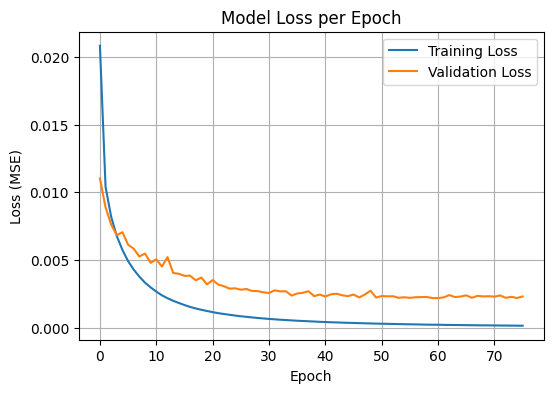

In [112]:
import matplotlib.pyplot as plt

# Ploting the training & validation loss values
plt.figure(figsize=(6, 4))

plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss per Epoch')
plt.xlabel('Epoch')
plt.ylabel('Loss (MSE)')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

---
### Defining functions for Image Stitching and Aligning Function For Visualizing later after Regression Model is Trained

---

In [113]:
val_df  = deepcopy(validation_df)
test1_df = deepcopy(test_df)
val_df['imagename'] = '6_' + val_df['imagename']
test1_df['imagename'] = '6_' + test1_df['imagename']
gru_test_df['imagename'] = '6_' + gru_test_df['imagename']

In [125]:
import os
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

def inverse_rotate_image(image, angle):
    height, width = image.shape[:2]
    center = (width // 2, height // 2)
    rotation_matrix = cv.getRotationMatrix2D(center, -angle, 1.0)  # Inverse rotation
    rotated_image = cv.warpAffine(image, rotation_matrix, (width, height), flags=cv.INTER_LINEAR)
    return rotated_image

def blend_images(base_image, overlay_image, x, y):
    """
    Blends overlay_image onto base_image at position (x, y).
    """
    h, w = overlay_image.shape[:2]
    
    # to Ensure placement is in the base image bounds
    if x < 0:
        overlay_image = overlay_image[:, -x:]
        x = 0
    if y < 0:
        overlay_image = overlay_image[-y:, :]
        y = 0
    if x + w > base_image.shape[1]:
        overlay_image = overlay_image[:, :base_image.shape[1] - x]
    if y + h > base_image.shape[0]:
        overlay_image = overlay_image[:base_image.shape[0] - y, :]
    
    h, w = overlay_image.shape[:2]

    # Blending the images in the overlapping area
    alpha = 0.5  # Blending fact
    base_image[y:y+h, x:x+w] = cv.addWeighted(base_image[y:y+h, x:x+w], alpha, overlay_image, alpha, 0)

def create_stitched_image(augmented_filename, feature_vector, labels, original_folder, masked_synthetic_folder, max_nu_of_splits, model):
    # Extract base name by removing any prefix ( "1_", "2_")
    # Split the filename to get the original image name
    base_name = '_'.join(augmented_filename.split('_')[1:])
    
    # Construct the path to the original image
    original_image_path = os.path.join(original_folder, base_name)
    print(f"Trying to read original image from: {original_image_path}")
    
    original_image = cv.imread(original_image_path)
    if original_image is None:
        print(f"Error: Could not read original image {base_name}")
        return

    # Rotate the original image by 90 degrees counterclockwise
    original_image = cv.rotate(original_image, cv.ROTATE_90_COUNTERCLOCKWISE)

    # Only processing the first augmented set (1_imgname.jpg)
    augmented_base_name = f"1_{base_name.split('.')[0]}"
    print(f"Processing augmented set: {augmented_base_name}")

    # Getting split images for this augmented set
    split_images = []
    for i in range(1, max_nu_of_splits + 1):
        split_image_path = os.path.join(masked_synthetic_folder, f"{augmented_base_name}_{i}.jpg")
        print(f"Trying to read split image from: {split_image_path}")

        if os.path.exists(split_image_path):
            split_image = cv.imread(split_image_path, cv.IMREAD_GRAYSCALE)
            if split_image is None:
                print(f"Error: Could not read split image {split_image_path}")
                continue
            split_images.append(split_image)
        else:
            print(f"Split image not found at path: {split_image_path}")
            break

    if len(split_images) < max_nu_of_splits:
        print(f"Error: Not enough split images for {augmented_base_name}")
        return

    # Predicting coordinates and rotations
    predicted_values = model.predict(np.expand_dims(feature_vector, axis=0))[0]

    # Denormalizing
    predicted_coordinates = predicted_values[:6] * 512
    predicted_rotations = predicted_values[6:] * 10

    # Calculating the average of predicted coordinates to adjust the canvas center
    avg_x = np.mean(predicted_coordinates[::2])
    avg_y = np.mean(predicted_coordinates[1::2])

    # Creating a canvas of 1024x1024 with adjusted center and light yellow background
    canvas_size = 1024
    canvas_center_x = int(canvas_size // 2 - avg_x)
    canvas_center_y = int(canvas_size // 2 - avg_y)
    canvas = np.full((canvas_size, canvas_size, 3), (255, 255, 224), dtype=np.uint8)  # Light yellow background

    for i in range(max_nu_of_splits):
        x = int(predicted_coordinates[2 * i]) + canvas_center_x
        y = int(predicted_coordinates[2 * i + 1]) + canvas_center_y
        angle = predicted_rotations[i]

        split_image = cv.cvtColor(split_images[i], cv.COLOR_GRAY2BGR)
        rotated_image = inverse_rotate_image(split_image, angle)

        blend_images(canvas, rotated_image, x, y)

    # Plotting the images
    fig, ax = plt.subplots(1, 3, figsize=(18, 6))

    ax[0].imshow(cv.cvtColor(original_image, cv.COLOR_BGR2RGB))
    ax[0].set_title("Original Image")
    ax[0].axis('off')

    ax[1].imshow(cv.cvtColor(canvas, cv.COLOR_BGR2RGB))
    ax[1].set_title(f"Stitched Image 1")
    ax[1].axis('off')

    ax[2].text(0.1, 0.5, f"Image: {augmented_base_name}\nPredicted Labels:\n{np.round(predicted_values[:6]*512).astype(int).tolist()} \n{np.round(predicted_values[6:] * 10,2).tolist()}\n\nActual Relative Labels:\n{labels[:6]} \n{labels[6:]}", fontsize=12, wrap=True)
    ax[2].set_title(f"Labels 1")
    ax[2].axis('off')

    plt.show()


-----------------------
# Training the Regression models
-----------------------

In [116]:
X_train = np.stack(train_df['feature_vector'].values)
y_train = np.stack(train_df['labels'].values)

X_val = np.stack(validation_df['feature_vector'].values)
y_val = np.stack(validation_df['labels'].values)

X_test = np.stack(test_df['feature_vector'].values)
y_test = np.stack(test_df['labels'].values)

In [117]:
print("Num GPUs Available: ", len(tf.config.experimental.list_physical_devices('GPU')))

Num GPUs Available:  0


-------
### Best Model For Leg Dataset
-------

Num GPUs Available:  0


Model: "functional_65"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_32      │ (None, 2304)      │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ reshape_6 (Reshape) │ (None, 3, 768)    │          0 │ input_layer_32[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ get_item_6          │ (None, 1, 768)    │          0 │ reshape_6[0][0]   │
│ (GetItem)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ get_item_7          │ (None, 1, 768)    │          0 │ reshape_6[0][0]   │
│ (GetItem)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ get_item_8          │ (None, 1, 768)    │          0 │ reshape_6[0][0]   │
│ (GetItem)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_18 (Conv1D)  │ (None, 1, 64)     │    147,520 │ get_item_6[0][0], │
│                     │                   │            │ get_item_7[0][0], │
│                     │                   │            │ get_item_8[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_19 (Conv1D)  │ (None, 1, 32)     │      6,176 │ conv1d_18[0][0],  │
│                     │                   │            │ conv1d_18[1][0],  │
│                     │                   │            │ conv1d_18[2][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_20 (Conv1D)  │ (None, 1, 1)      │         97 │ conv1d_19[0][0],  │
│                     │                   │            │ conv1d_19[1][0],  │
│                     │                   │            │ conv1d_19[2][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ flatten_19          │ (None, 1)         │          0 │ conv1d_20[0][0]   │
│ (Flatten)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ flatten_20          │ (None, 1)         │          0 │ conv1d_20[1][0]   │
│ (Flatten)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ flatten_21          │ (None, 1)         │          0 │ conv1d_20[2][0]   │
│ (Flatten)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_2       │ (None, 3)         │          0 │ flatten_19[0][0], │
│ (Concatenate)       │                   │            │ flatten_20[0][0], │
│                     │                   │            │ flatten_21[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_143 (Dense)   │ (None, 512)       │      2,048 │ concatenate_2[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 512)       │      2,048 │ dense_143[0][0]   │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu_111     │ (None, 512)       │          0 │ batch_normalizat… │
│ (LeakyReLU)         │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_111         │ (None, 512)       │          0 │ leaky_re_lu_111[… │
│ (Dropout)           │                   │            │                 

 Total params: 426,186 (1.63 MB)

 Trainable params: 423,626 (1.62 MB)

 Non-trainable params: 2,560 (10.00 KB)

None
Epoch 1/100
1350/1350 ━━━━━━━━━━━━━━━━━━━━ 7s 4ms/step - custom_angular_error: 0.5842 - custom_euclidean_distance: 1.7994 - loss: 1.9556 - mae: 0.7063 - mse: 0.9036 - val_custom_angular_error: 0.4474 - val_custom_euclidean_distance: 0.3017 - val_loss: 1.1192 - val_mae: 0.2310 - val_mse: 0.1380 - learning_rate: 1.0000e-04
Epoch 2/100
1350/1350 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - custom_angular_error: 0.5119 - custom_euclidean_distance: 1.0008 - loss: 1.3888 - mae: 0.4464 - mse: 0.3928 - val_custom_angular_error: 0.4185 - val_custom_euclidean_distance: 0.1588 - val_loss: 1.0271 - val_mae: 0.1879 - val_mse: 0.1027 - learning_rate: 1.0000e-04
Epoch 3/100
1350/1350 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - custom_angular_error: 0.4691 - custom_euclidean_distance: 0.7057 - loss: 1.1913 - mae: 0.3487 - mse: 0.2626 - val_custom_angular_error: 0.4183 - val_custom_euclidean_distance: 0.1427 - val_loss: 0.9590 - val_mae: 0.1849 - val_mse: 0.1027 - learning_rate: 1.0000e-04
Epoch 4/100
1350/1350 ━━━━

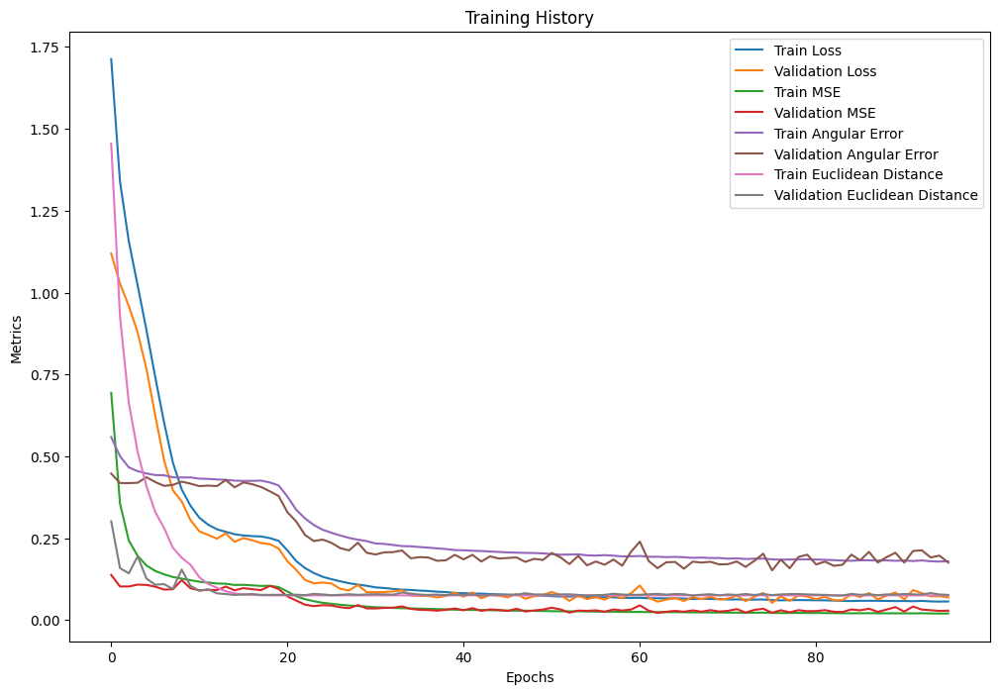

In [328]:
#FCN Using 1D-Convolution ( custom loss )
import tensorflow as tf
from tensorflow.keras.layers import Input, Dense, BatchNormalization, LeakyReLU, Dropout, Conv1D, Flatten, Reshape, Concatenate
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping
import os
import pandas as pd
import matplotlib.pyplot as plt

# Ensure GPU availability
print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))

# Custom Loss Function (as defined before)
def custom_loss(y_true, y_pred):
    coords_true = y_true[:, :6]
    coords_pred = y_pred[:, :6]
    rotations_true = y_true[:, 6:]
    rotations_pred = y_pred[:, 6:]

    coords_loss = tf.reduce_mean(tf.square(coords_true - coords_pred))
    rotations_loss = tf.reduce_mean(tf.square(tf.sin(rotations_true - rotations_pred)))

    total_loss = coords_loss + rotations_loss
    return total_loss

# Custom Metrics (as defined before)
def custom_angular_error(y_true, y_pred):
    rotations_true = y_true[:, 6:] 
    rotations_pred = y_pred[:, 6:]
    angular_error = tf.reduce_mean(tf.abs(tf.sin(rotations_true - rotations_pred)))
    return angular_error

def custom_euclidean_distance(y_true, y_pred):
    coords_true = y_true[:, :6] 
    coords_pred = y_pred[:, :6]
    euclidean_distance = tf.reduce_mean(tf.sqrt(tf.reduce_sum(tf.square(coords_true - coords_pred), axis=-1)))
    return euclidean_distance

# Build the Model with 1D Convolution and FCN
def build_model_with_conv1d_and_fcn(input_shape):
    input_layer = Input(shape=(input_shape,))
    
    # Reshape the input into (None, 3, 768)
    reshaped_input = Reshape((3, 768))(input_layer)
    
    # Define a shared Conv1D layer to reduce each 768-dimensional vector to 256
    conv1 = Conv1D(filters=64, kernel_size=3, padding='same', activation='relu')
    conv2 = Conv1D(filters=32, kernel_size=3, padding='same', activation='relu')
    conv3 = Conv1D(filters=1, kernel_size=3, padding='same', activation='relu')
    
    # Apply Conv1D to each of the three 768-dimensional vectors
    conv_output1 = conv3(conv2(conv1(reshaped_input[:, 0:1, :])))
    conv_output2 = conv3(conv2(conv1(reshaped_input[:, 1:2, :])))
    conv_output3 = conv3(conv2(conv1(reshaped_input[:, 2:3, :])))

    # Concatenate the outputs back into a single 768-dimensional vector
    concatenated_output = Concatenate(axis=-1)([Flatten()(conv_output1), Flatten()(conv_output2), Flatten()(conv_output3)])

    # Fully Connected Network (FCN) on the concatenated vector
    x = Dense(units=512, kernel_regularizer=tf.keras.regularizers.l2(0.001))(concatenated_output)
    x = BatchNormalization()(x)
    x = LeakyReLU()(x)
    x = Dropout(0.5)(x)

    x = Dense(units=256, kernel_regularizer=tf.keras.regularizers.l2(0.001))(x)
    x = BatchNormalization()(x)
    x = LeakyReLU()(x)
    x = Dropout(0.4)(x)

    x = Dense(units=256, kernel_regularizer=tf.keras.regularizers.l2(0.001))(x)
    x = BatchNormalization()(x)
    x = LeakyReLU()(x)
    x = Dropout(0.3)(x)

    x = Dense(units=256, kernel_regularizer=tf.keras.regularizers.l2(0.001))(x)
    x = BatchNormalization()(x)
    x = LeakyReLU()(x)
    x = Dropout(0.2)(x)

    output_layer = Dense(9)(x)

    model = Model(inputs=input_layer, outputs=output_layer)
    model.compile(optimizer=Adam(learning_rate=1e-4), 
                  loss=custom_loss, 
                  metrics=['mse', 'mae', custom_angular_error, custom_euclidean_distance])
    return model

input_shape = X_train.shape[1]

# Build and compile the model
model = build_model_with_conv1d_and_fcn(input_shape=input_shape)

# Print model summary
print(model.summary())

# Define the callbacks
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=5, min_lr=0.0001)
early_stopping = EarlyStopping(monitor='val_loss', patience=20, restore_best_weights=True)

# Train the model
history = model.fit(X_train, y_train, epochs=100, validation_data=(X_val, y_val),
                    callbacks=[reduce_lr, early_stopping], batch_size=16, verbose=1)

# Evaluate the model on the test set
test_loss, test_mse, test_mae, test_angular_error, test_euclidean_distance = model.evaluate(X_test, y_test, verbose=0)

# Print the evaluation metrics
print(f"Test Loss: {test_loss}")
print(f"Test MSE: {test_mse}")
print(f"Test MAE: {test_mae}")
print(f"Test Angular Error: {test_angular_error}")
print(f"Test Euclidean Distance: {test_euclidean_distance}")

# Plot the training history
plt.figure(figsize=(12, 8))
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.plot(history.history['mse'], label='Train MSE')
plt.plot(history.history['val_mse'], label='Validation MSE')
plt.plot(history.history['custom_angular_error'], label='Train Angular Error')
plt.plot(history.history['val_custom_angular_error'], label='Validation Angular Error')
plt.plot(history.history['custom_euclidean_distance'], label='Train Euclidean Distance')
plt.plot(history.history['val_custom_euclidean_distance'], label='Validation Euclidean Distance')
plt.legend()
plt.title('Training History')
plt.xlabel('Epochs')
plt.ylabel('Metrics')
plt.show()

# Save the history to a CSV file
history_df = pd.DataFrame(history.history)
history_file = os.path.join("experiments", "model_architecture_history_with_conv1d_fcn.csv")
history_df.to_csv(history_file, index=False)


---
## Before and after images

---
the split images against the aligned and stitched images

Trying to read original image from: /Users/rishabhdubey/Downloads/BothComplete/IMG0000278.jpg
Processing augmented set: 1_IMG0000278
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0000278_1.jpg
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0000278_2.jpg
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0000278_3.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


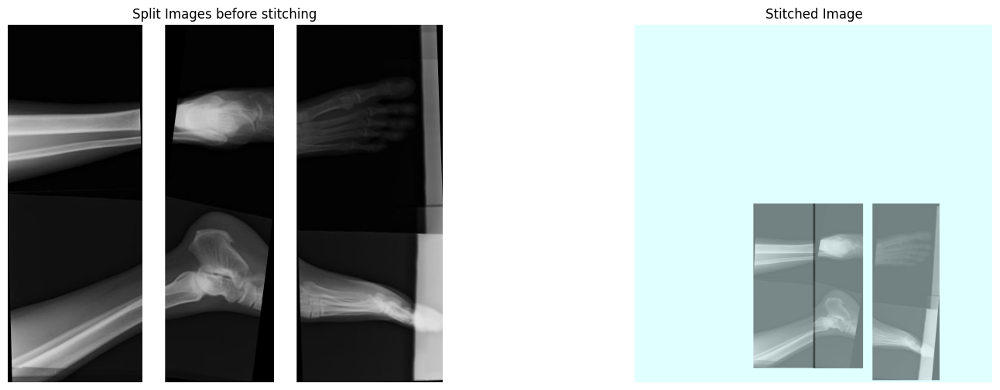

Trying to read original image from: /Users/rishabhdubey/Downloads/BothComplete/IMG0000898.jpg
Processing augmented set: 1_IMG0000898
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0000898_1.jpg
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0000898_2.jpg
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0000898_3.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


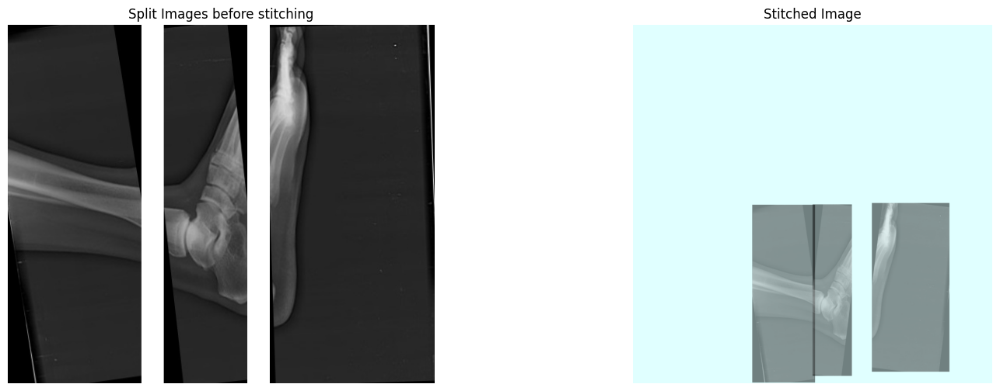

Trying to read original image from: /Users/rishabhdubey/Downloads/BothComplete/IMG0003822.jpg
Processing augmented set: 1_IMG0003822
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0003822_1.jpg
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0003822_2.jpg
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0003822_3.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step


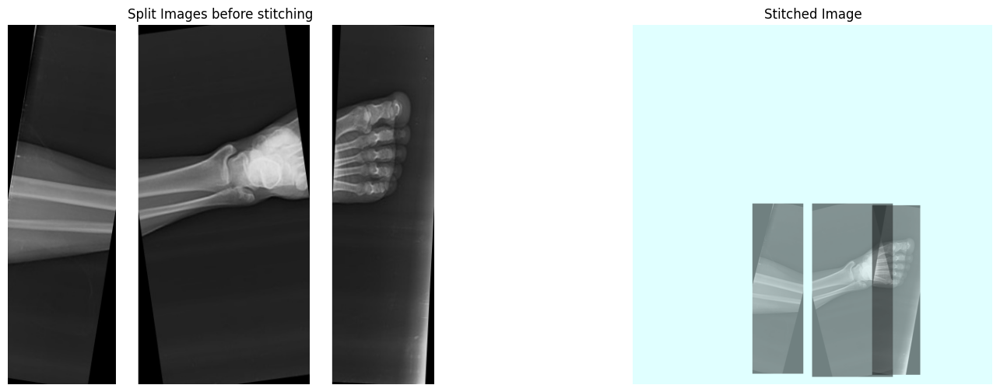

Trying to read original image from: /Users/rishabhdubey/Downloads/BothComplete/IMG0003228.jpg
Processing augmented set: 1_IMG0003228
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0003228_1.jpg
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0003228_2.jpg
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0003228_3.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step


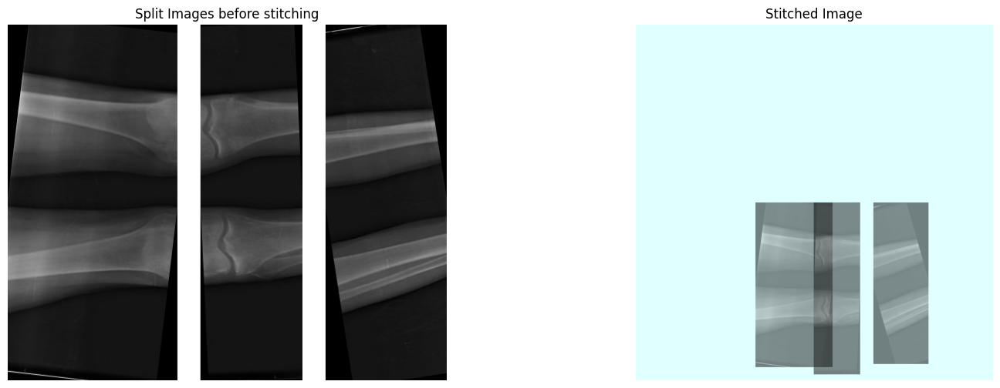

Trying to read original image from: /Users/rishabhdubey/Downloads/BothComplete/IMG0000709.jpg
Processing augmented set: 1_IMG0000709
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0000709_1.jpg
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0000709_2.jpg
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0000709_3.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step


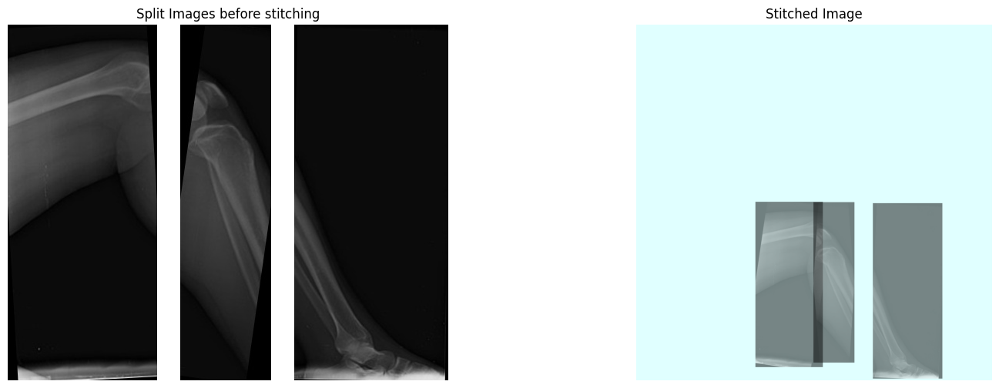

Trying to read original image from: /Users/rishabhdubey/Downloads/BothComplete/IMG0003572.jpg
Processing augmented set: 1_IMG0003572
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0003572_1.jpg
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0003572_2.jpg
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0003572_3.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step


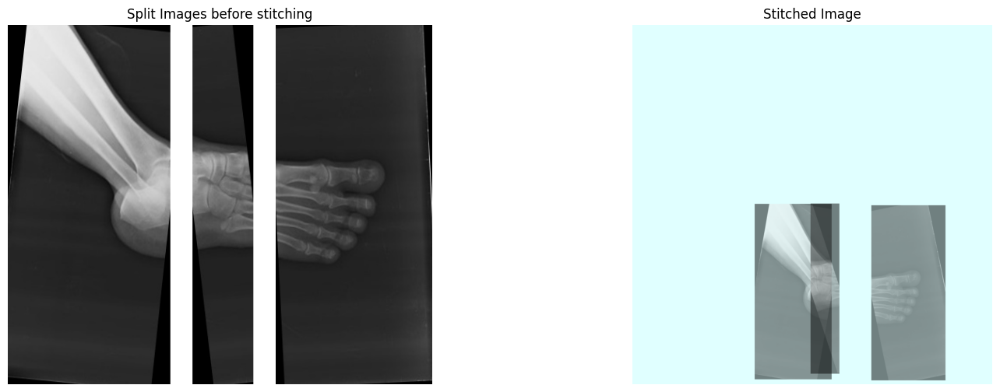

Trying to read original image from: /Users/rishabhdubey/Downloads/BothComplete/IMG0002295.jpg
Processing augmented set: 1_IMG0002295
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0002295_1.jpg
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0002295_2.jpg
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0002295_3.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step


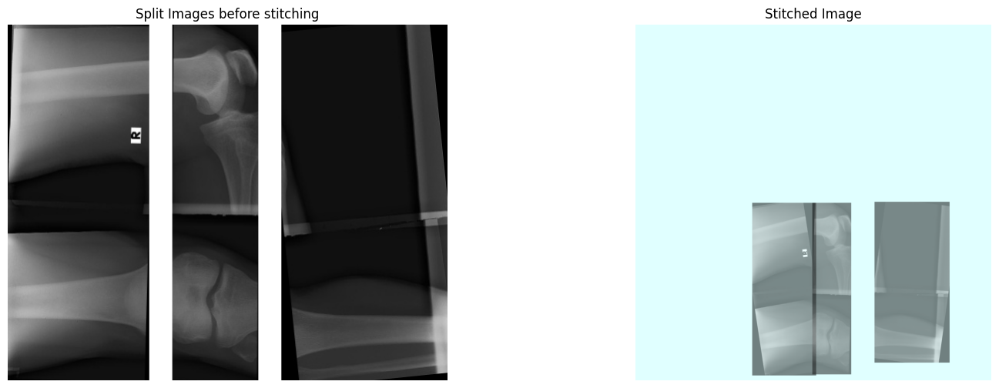

Trying to read original image from: /Users/rishabhdubey/Downloads/BothComplete/IMG0001979.jpg
Processing augmented set: 1_IMG0001979
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0001979_1.jpg
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0001979_2.jpg
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0001979_3.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step


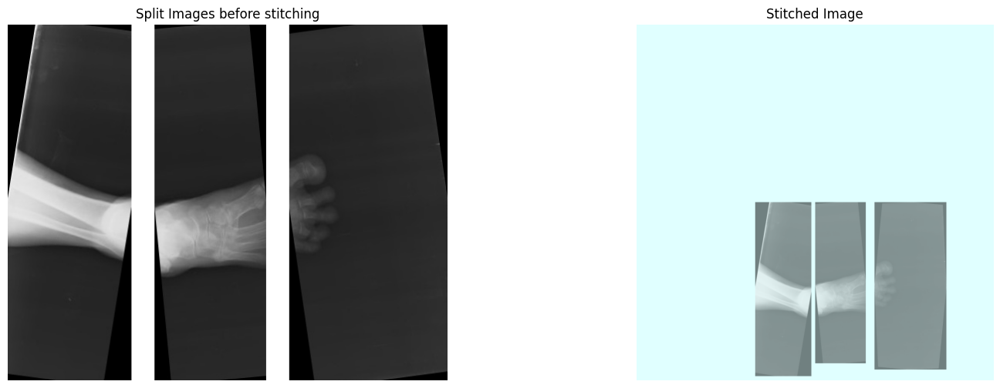

Trying to read original image from: /Users/rishabhdubey/Downloads/BothComplete/IMG0000093.jpg
Processing augmented set: 1_IMG0000093
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0000093_1.jpg
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0000093_2.jpg
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0000093_3.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step


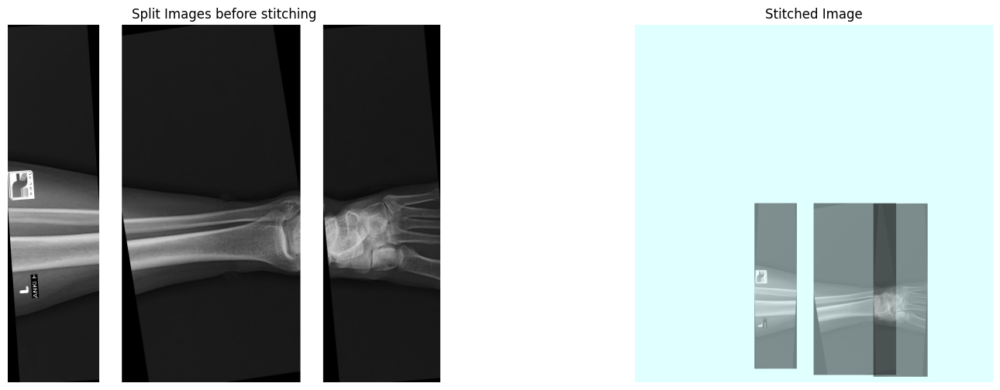

Trying to read original image from: /Users/rishabhdubey/Downloads/BothComplete/IMG0003940.jpg
Processing augmented set: 1_IMG0003940
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0003940_1.jpg
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0003940_2.jpg
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0003940_3.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step


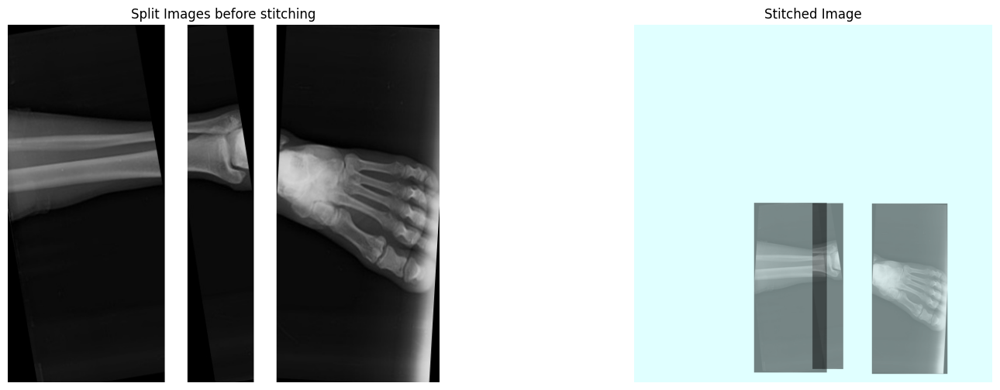

Trying to read original image from: /Users/rishabhdubey/Downloads/BothComplete/IMG0000054.jpg
Processing augmented set: 1_IMG0000054
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0000054_1.jpg
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0000054_2.jpg
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0000054_3.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step


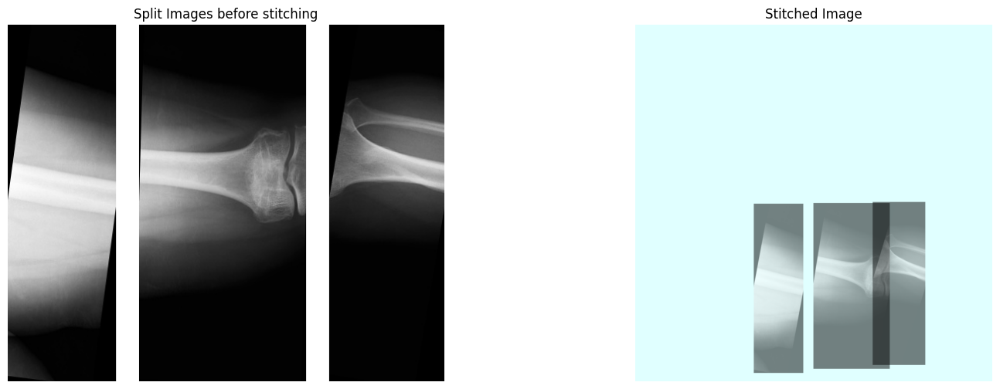

Trying to read original image from: /Users/rishabhdubey/Downloads/BothComplete/IMG0002051.jpg
Processing augmented set: 1_IMG0002051
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0002051_1.jpg
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0002051_2.jpg
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0002051_3.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step


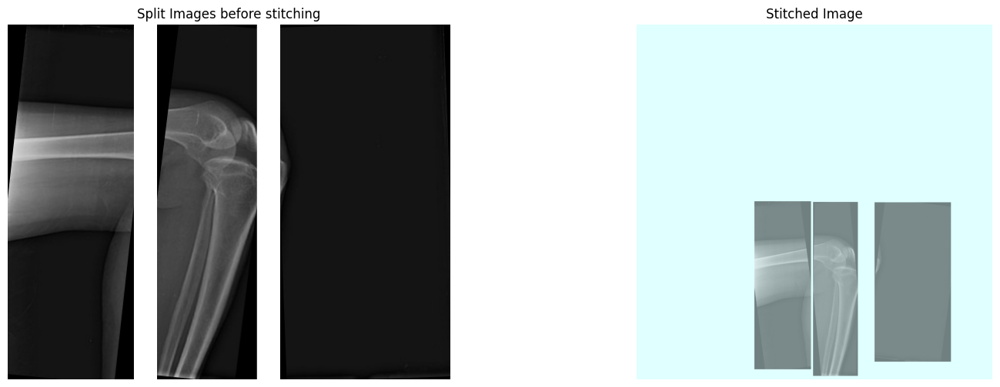

Trying to read original image from: /Users/rishabhdubey/Downloads/BothComplete/IMG0000646.jpg
Processing augmented set: 1_IMG0000646
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0000646_1.jpg
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0000646_2.jpg
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0000646_3.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step


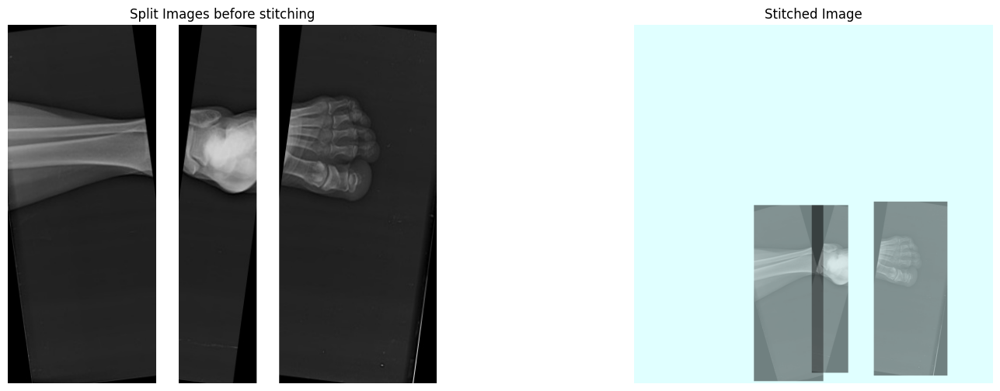

Trying to read original image from: /Users/rishabhdubey/Downloads/BothComplete/IMG0001229.jpg
Processing augmented set: 1_IMG0001229
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0001229_1.jpg
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0001229_2.jpg
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0001229_3.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step


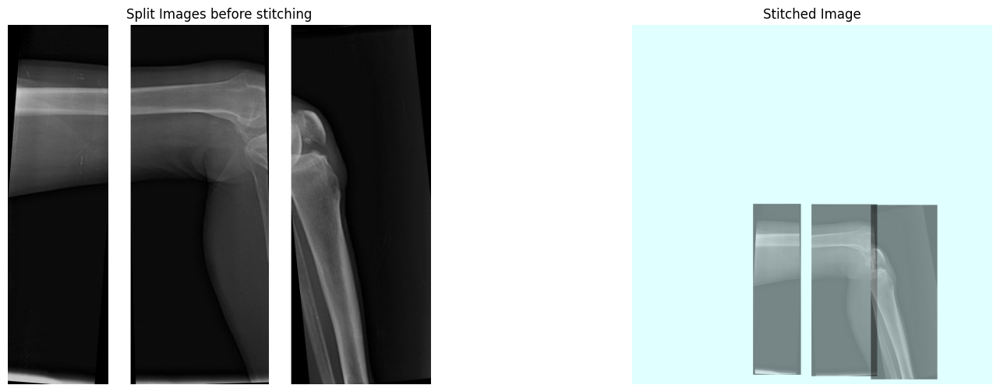

Trying to read original image from: /Users/rishabhdubey/Downloads/BothComplete/IMG0000876.jpg
Processing augmented set: 1_IMG0000876
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0000876_1.jpg
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0000876_2.jpg
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0000876_3.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step


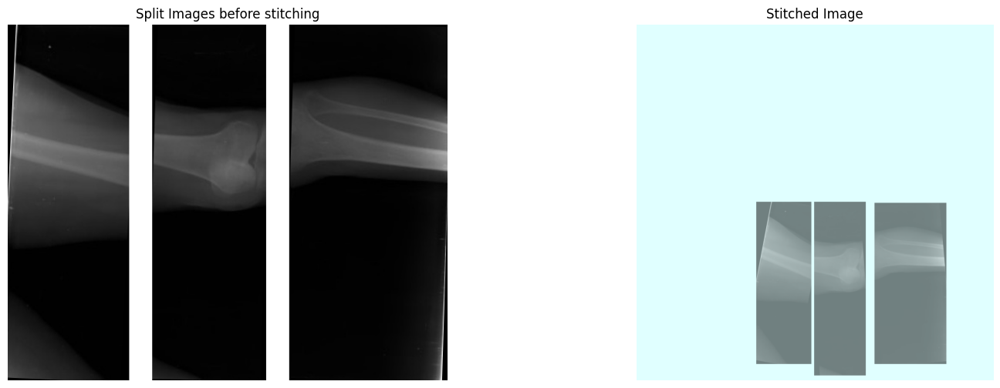

Trying to read original image from: /Users/rishabhdubey/Downloads/BothComplete/IMG0003832.jpg
Processing augmented set: 1_IMG0003832
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0003832_1.jpg
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0003832_2.jpg
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0003832_3.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step


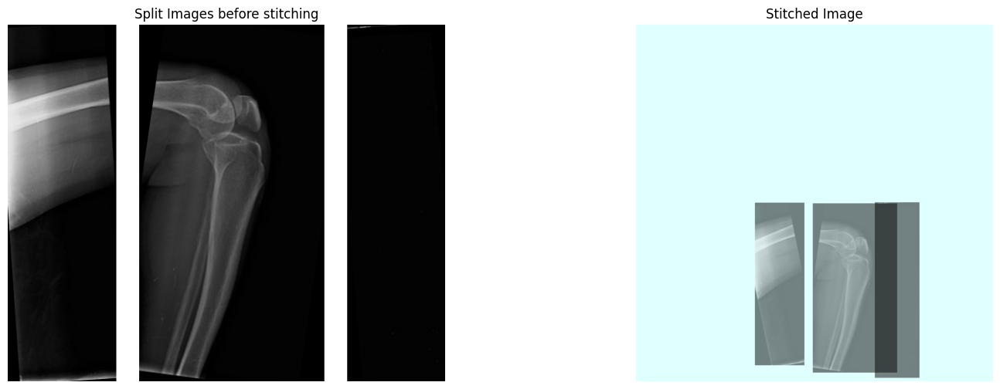

Trying to read original image from: /Users/rishabhdubey/Downloads/BothComplete/IMG0001599.jpg
Processing augmented set: 1_IMG0001599
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0001599_1.jpg
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0001599_2.jpg
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0001599_3.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step


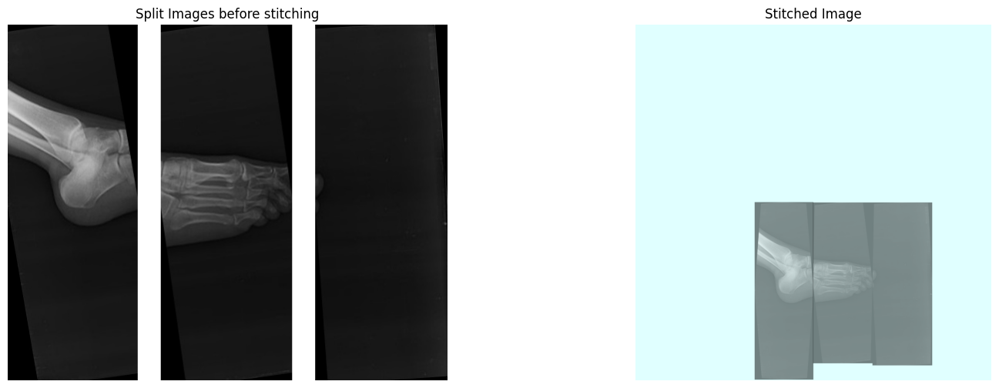

Trying to read original image from: /Users/rishabhdubey/Downloads/BothComplete/IMG0000964.jpg
Processing augmented set: 1_IMG0000964
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0000964_1.jpg
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0000964_2.jpg
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0000964_3.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step


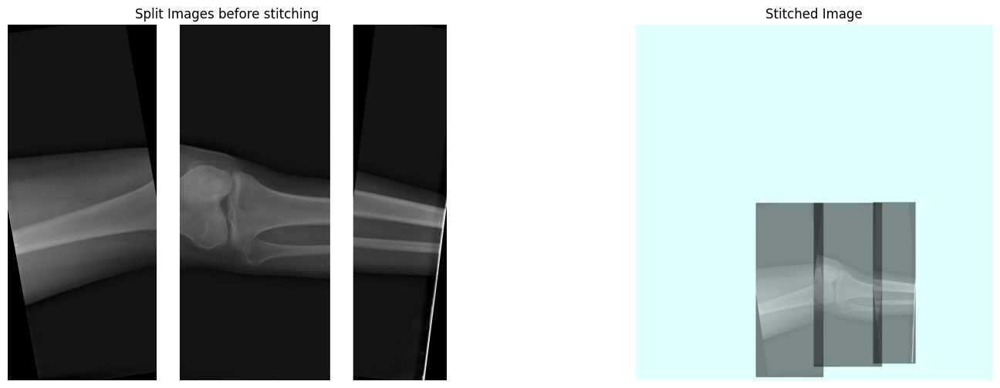

Trying to read original image from: /Users/rishabhdubey/Downloads/BothComplete/IMG0002183.jpg
Processing augmented set: 1_IMG0002183
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0002183_1.jpg
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0002183_2.jpg
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0002183_3.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step


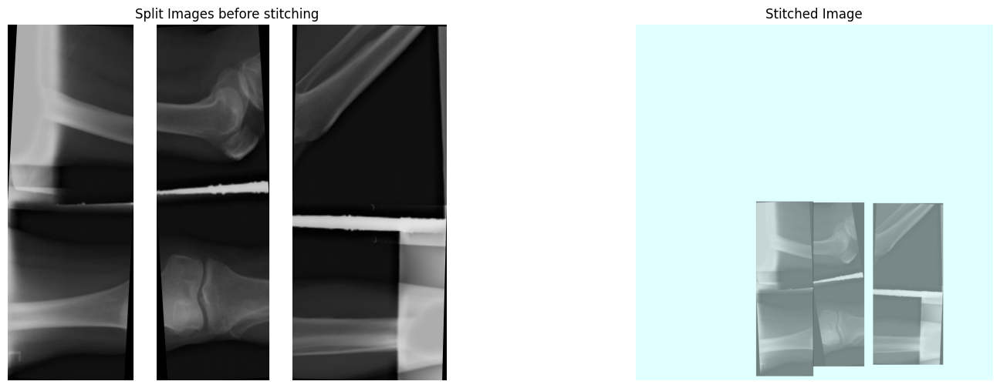

Trying to read original image from: /Users/rishabhdubey/Downloads/BothComplete/IMG0002752.jpg
Processing augmented set: 1_IMG0002752
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0002752_1.jpg
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0002752_2.jpg
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0002752_3.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step


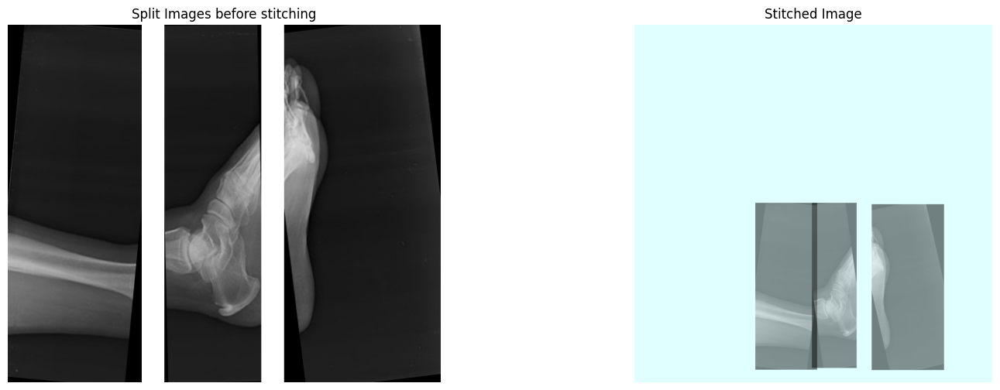

Trying to read original image from: /Users/rishabhdubey/Downloads/BothComplete/IMG0004134.jpg
Processing augmented set: 1_IMG0004134
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0004134_1.jpg
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0004134_2.jpg
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0004134_3.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step


Premature end of JPEG file


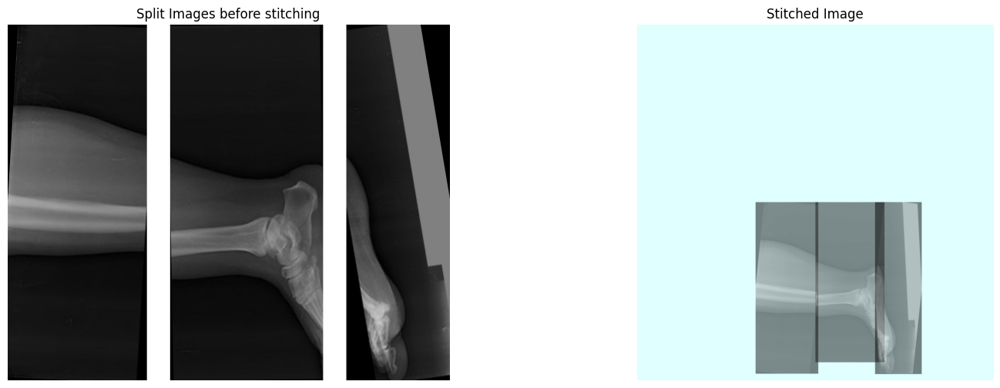

Trying to read original image from: /Users/rishabhdubey/Downloads/BothComplete/IMG0002341.jpg
Processing augmented set: 1_IMG0002341
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0002341_1.jpg
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0002341_2.jpg
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0002341_3.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step


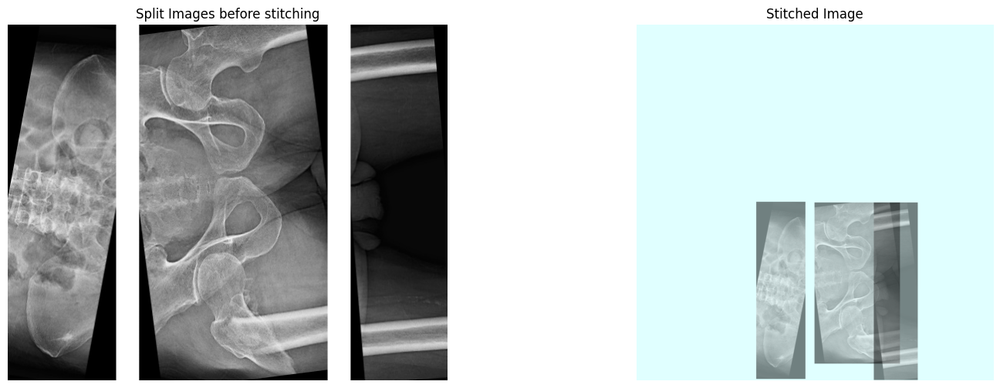

Trying to read original image from: /Users/rishabhdubey/Downloads/BothComplete/IMG0000556.jpg
Processing augmented set: 1_IMG0000556
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0000556_1.jpg
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0000556_2.jpg
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0000556_3.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step


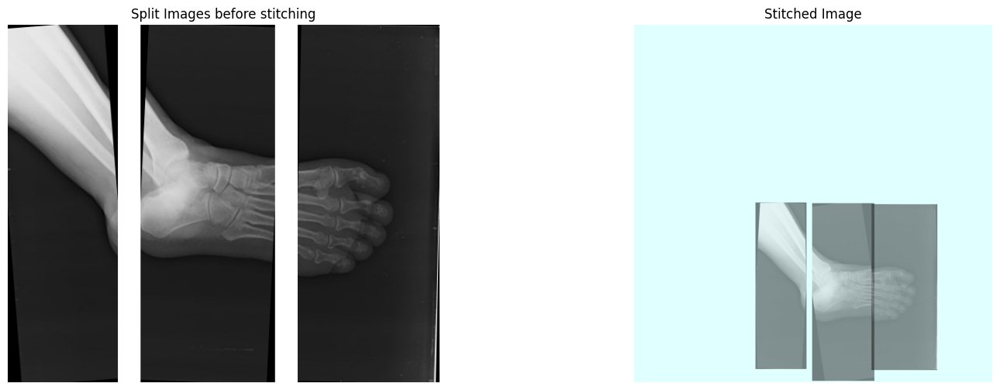

Trying to read original image from: /Users/rishabhdubey/Downloads/BothComplete/IMG0003498.jpg
Processing augmented set: 1_IMG0003498
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0003498_1.jpg
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0003498_2.jpg
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0003498_3.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step


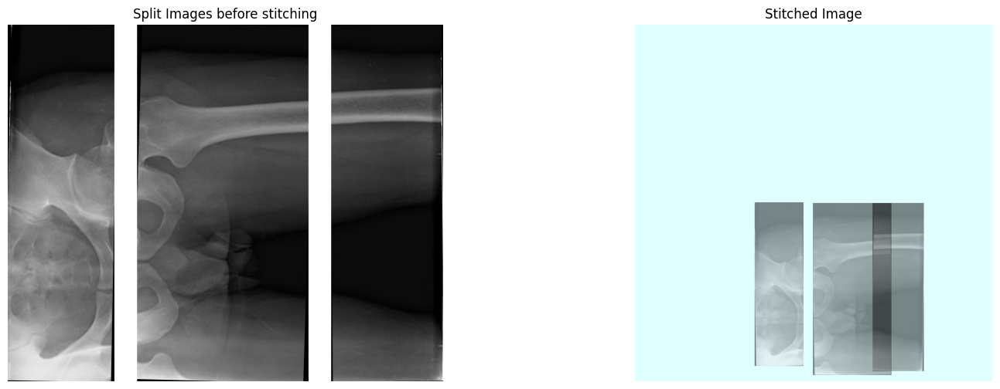

Trying to read original image from: /Users/rishabhdubey/Downloads/BothComplete/IMG0001714.jpg
Processing augmented set: 1_IMG0001714
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0001714_1.jpg
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0001714_2.jpg
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0001714_3.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step


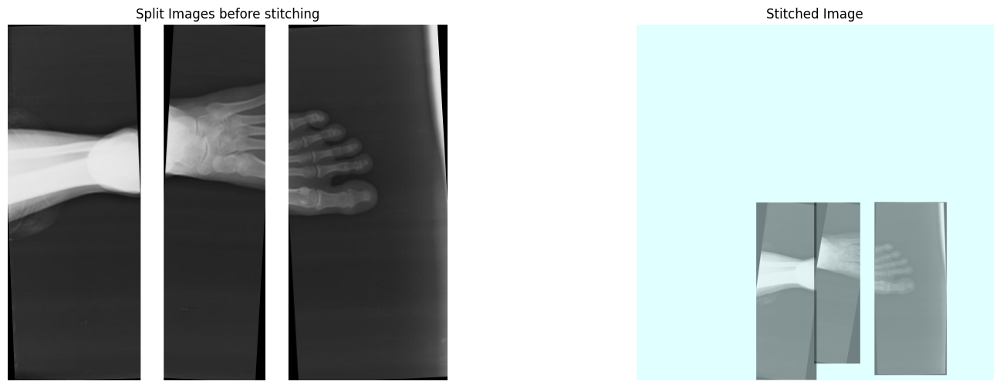

Trying to read original image from: /Users/rishabhdubey/Downloads/BothComplete/IMG0002220.jpg
Processing augmented set: 1_IMG0002220
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0002220_1.jpg
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0002220_2.jpg
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0002220_3.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step


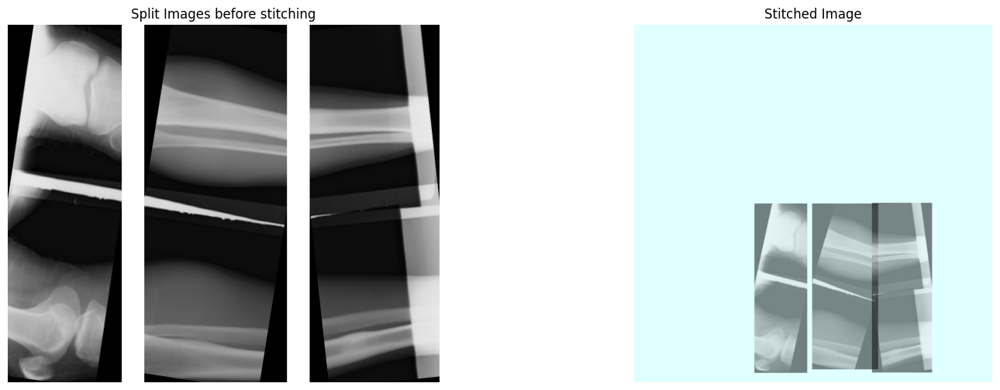

Trying to read original image from: /Users/rishabhdubey/Downloads/BothComplete/IMG0001503.jpg
Processing augmented set: 1_IMG0001503
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0001503_1.jpg
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0001503_2.jpg
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0001503_3.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step


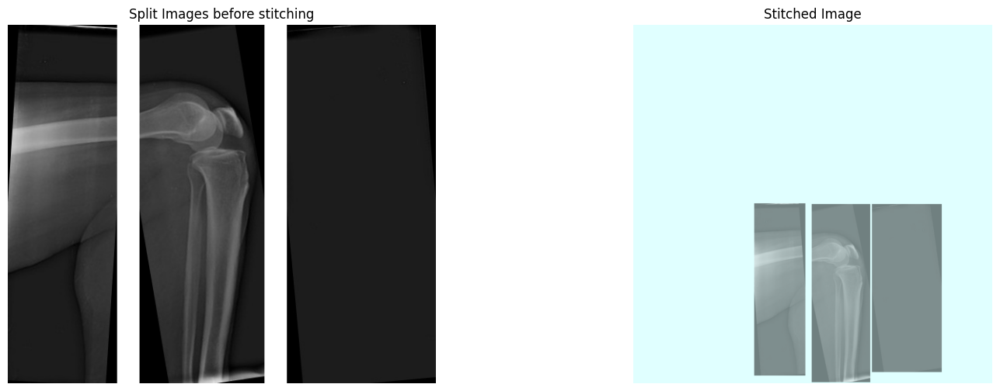

Trying to read original image from: /Users/rishabhdubey/Downloads/BothComplete/IMG0000154.jpg
Processing augmented set: 1_IMG0000154
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0000154_1.jpg
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0000154_2.jpg
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0000154_3.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step


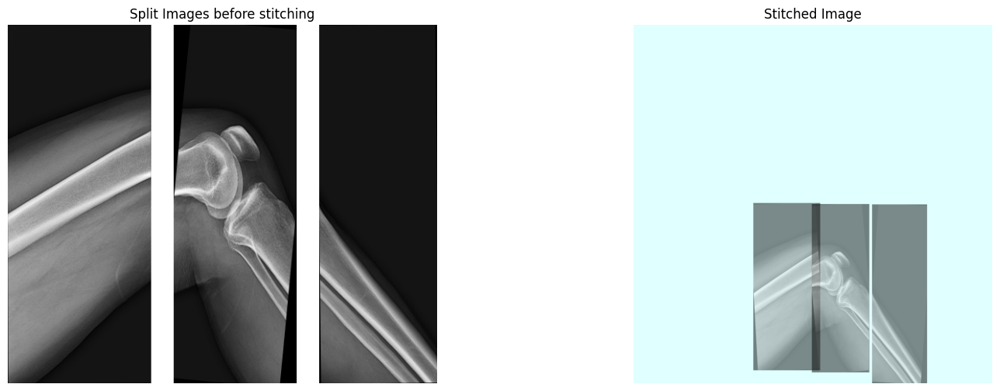

Trying to read original image from: /Users/rishabhdubey/Downloads/BothComplete/IMG0000343.jpg
Processing augmented set: 1_IMG0000343
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0000343_1.jpg
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0000343_2.jpg
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0000343_3.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step


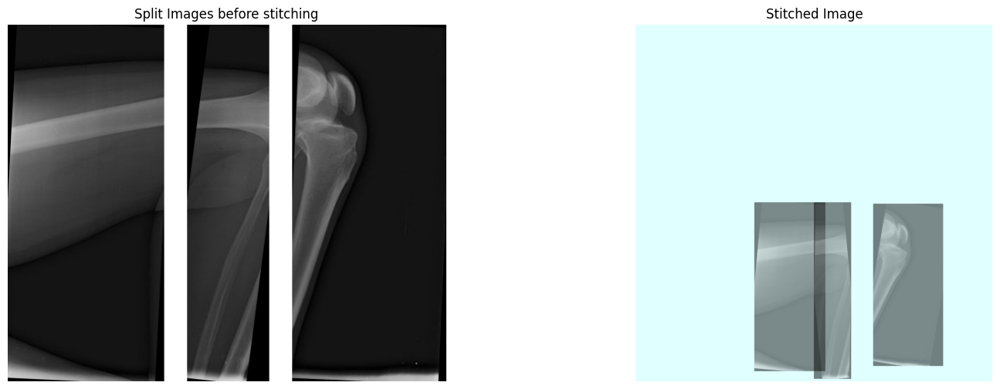

Trying to read original image from: /Users/rishabhdubey/Downloads/BothComplete/IMG0001115.jpg
Processing augmented set: 1_IMG0001115
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0001115_1.jpg
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0001115_2.jpg
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0001115_3.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step


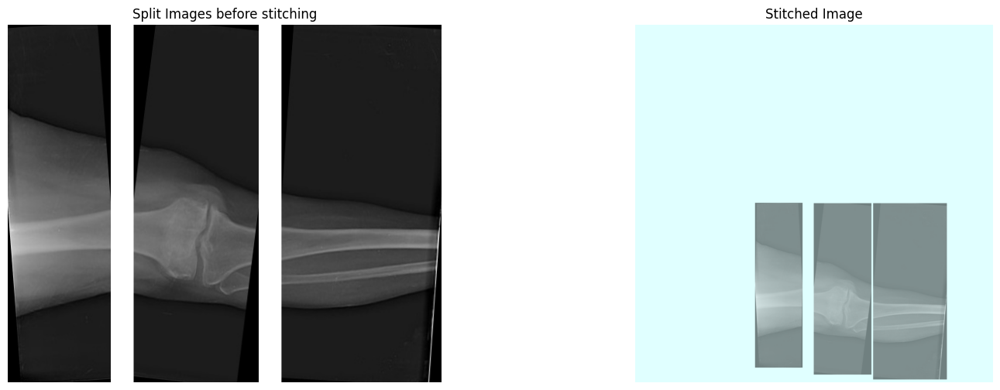

Trying to read original image from: /Users/rishabhdubey/Downloads/BothComplete/IMG0003096.jpg
Processing augmented set: 1_IMG0003096
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0003096_1.jpg
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0003096_2.jpg
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0003096_3.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step


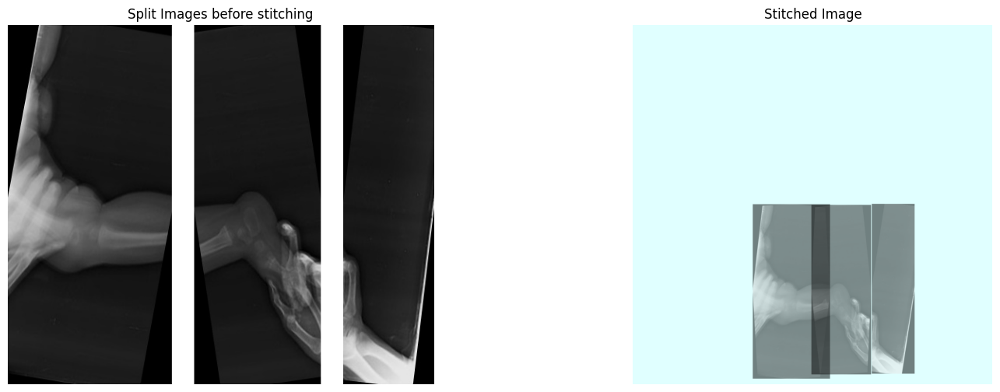

Trying to read original image from: /Users/rishabhdubey/Downloads/BothComplete/IMG0000776.jpg
Processing augmented set: 1_IMG0000776
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0000776_1.jpg
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0000776_2.jpg
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0000776_3.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step


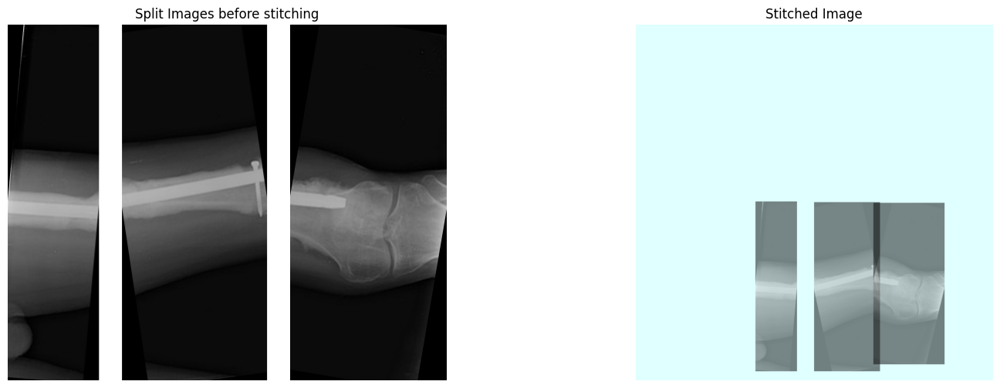

Trying to read original image from: /Users/rishabhdubey/Downloads/BothComplete/IMG0003108.jpg
Processing augmented set: 1_IMG0003108
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0003108_1.jpg
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0003108_2.jpg
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0003108_3.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step


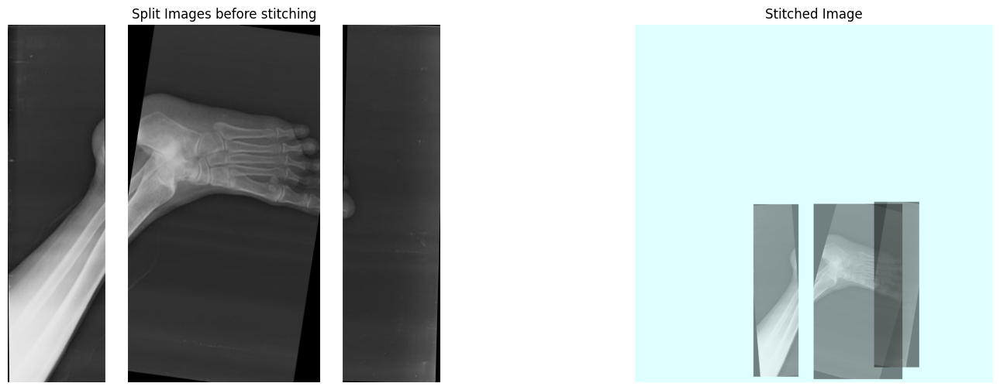

Trying to read original image from: /Users/rishabhdubey/Downloads/BothComplete/IMG0001858.jpg
Processing augmented set: 1_IMG0001858
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0001858_1.jpg
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0001858_2.jpg
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0001858_3.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step


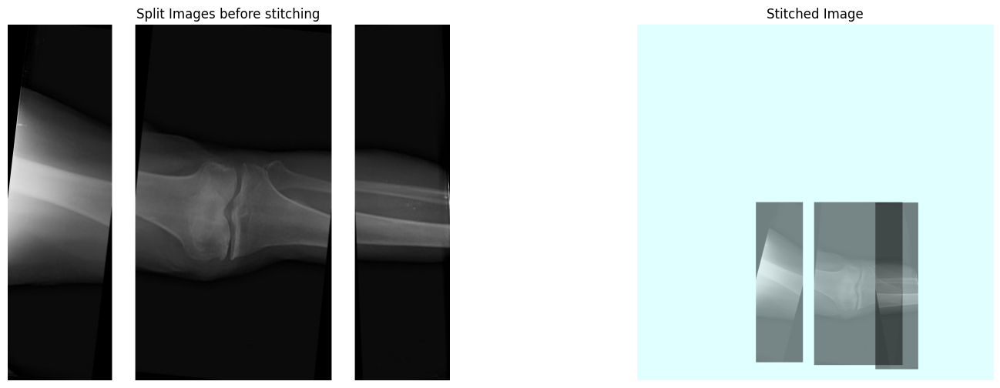

Trying to read original image from: /Users/rishabhdubey/Downloads/BothComplete/IMG0001292.jpg
Processing augmented set: 1_IMG0001292
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0001292_1.jpg
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0001292_2.jpg
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0001292_3.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step


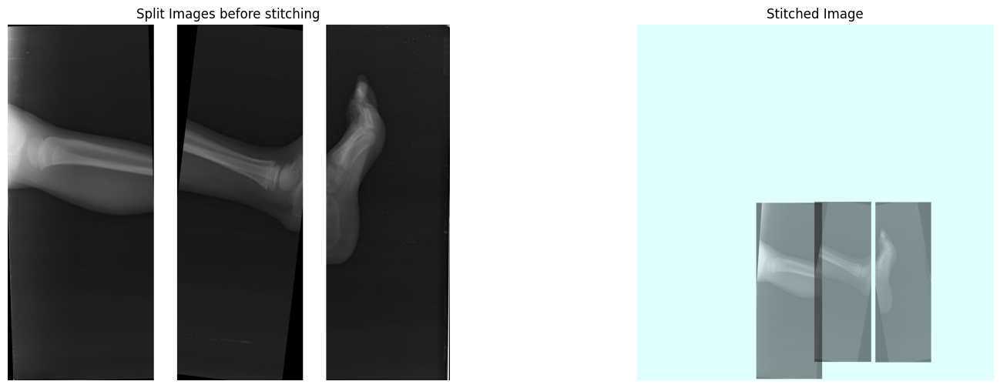

Trying to read original image from: /Users/rishabhdubey/Downloads/BothComplete/IMG0003889.jpg
Processing augmented set: 1_IMG0003889
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0003889_1.jpg
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0003889_2.jpg
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0003889_3.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step


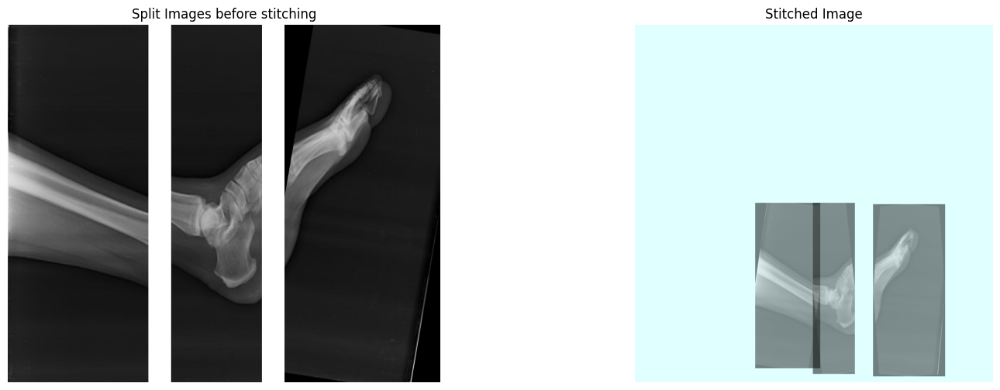

Trying to read original image from: /Users/rishabhdubey/Downloads/BothComplete/IMG0004062.jpg
Processing augmented set: 1_IMG0004062
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0004062_1.jpg
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0004062_2.jpg
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0004062_3.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step


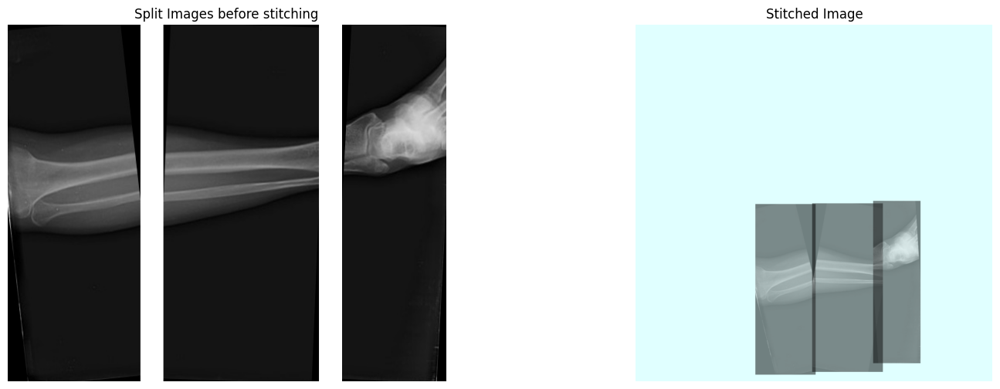

Trying to read original image from: /Users/rishabhdubey/Downloads/BothComplete/IMG0000238.jpg
Processing augmented set: 1_IMG0000238
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0000238_1.jpg
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0000238_2.jpg
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0000238_3.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step


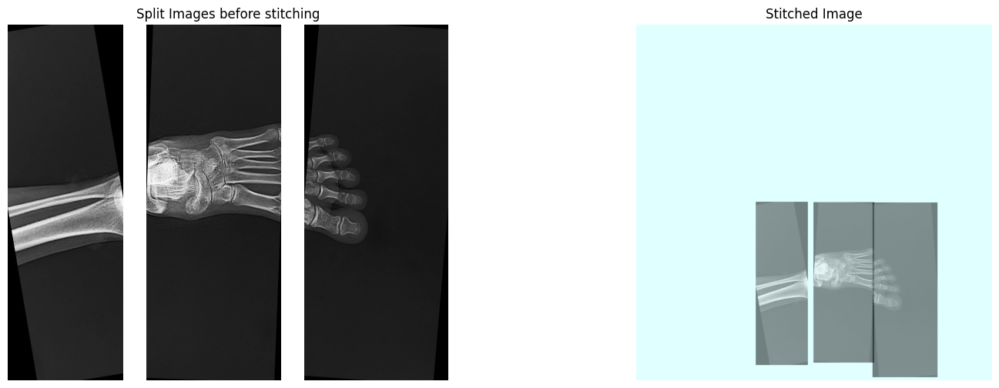

Trying to read original image from: /Users/rishabhdubey/Downloads/BothComplete/IMG0003912.jpg
Processing augmented set: 1_IMG0003912
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0003912_1.jpg
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0003912_2.jpg
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0003912_3.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step


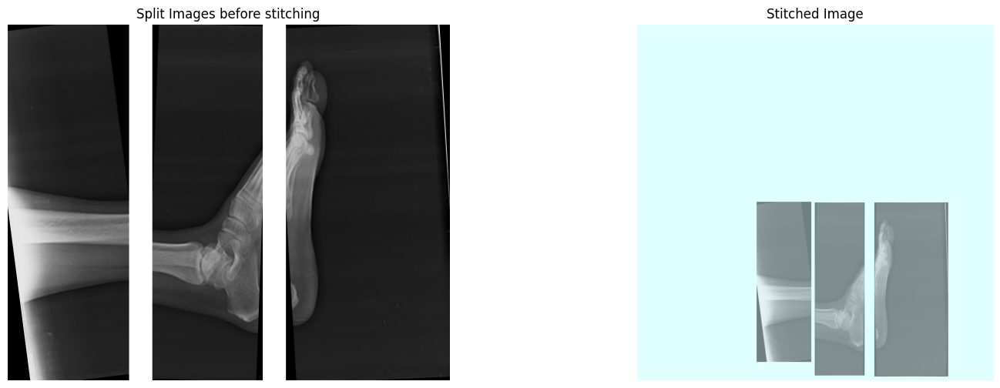

Trying to read original image from: /Users/rishabhdubey/Downloads/BothComplete/IMG0000002.jpg
Processing augmented set: 1_IMG0000002
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0000002_1.jpg
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0000002_2.jpg
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0000002_3.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step


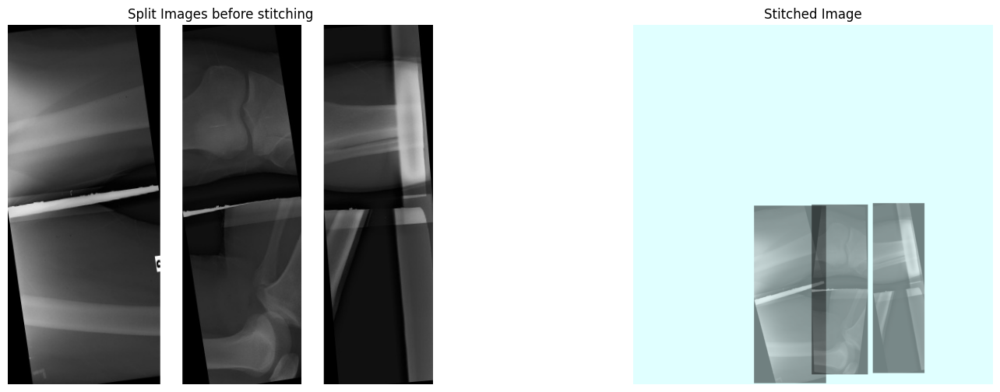

Trying to read original image from: /Users/rishabhdubey/Downloads/BothComplete/IMG0003443.jpg
Processing augmented set: 1_IMG0003443
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0003443_1.jpg
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0003443_2.jpg
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0003443_3.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step


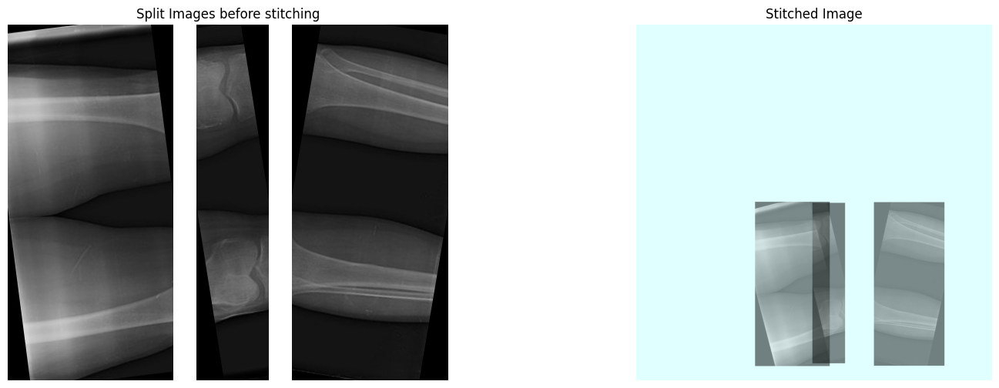

Trying to read original image from: /Users/rishabhdubey/Downloads/BothComplete/IMG0003696.jpg
Processing augmented set: 1_IMG0003696
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0003696_1.jpg
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0003696_2.jpg
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0003696_3.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step


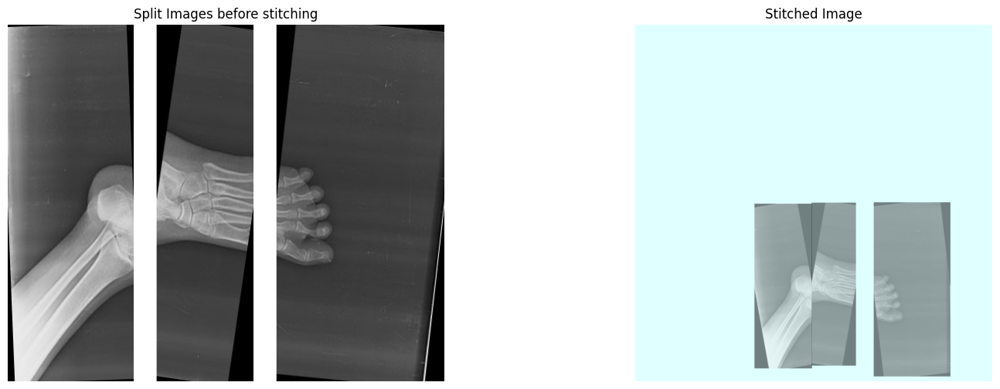

Trying to read original image from: /Users/rishabhdubey/Downloads/BothComplete/IMG0001725.jpg
Processing augmented set: 1_IMG0001725
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0001725_1.jpg
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0001725_2.jpg
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0001725_3.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step


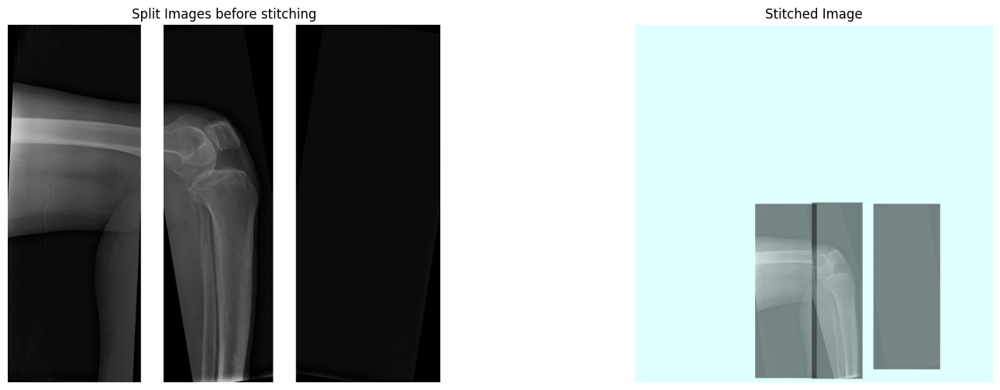

Trying to read original image from: /Users/rishabhdubey/Downloads/BothComplete/IMG0002428.jpg
Processing augmented set: 1_IMG0002428
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0002428_1.jpg
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0002428_2.jpg
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0002428_3.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step


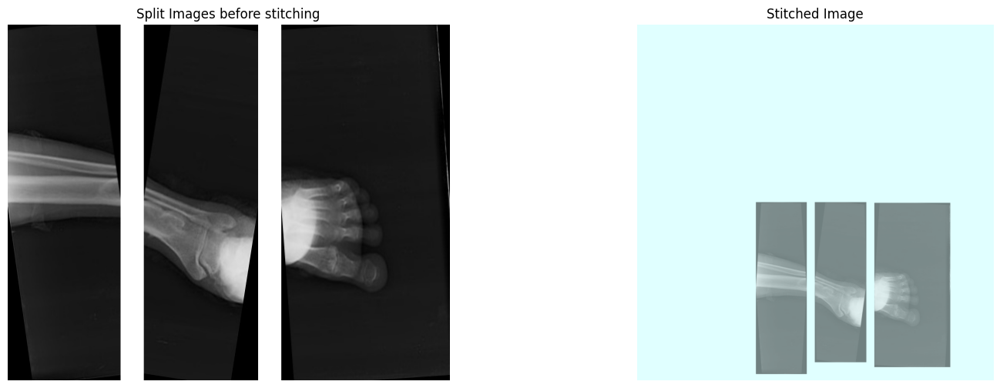

Trying to read original image from: /Users/rishabhdubey/Downloads/BothComplete/IMG0002788.jpg
Processing augmented set: 1_IMG0002788
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0002788_1.jpg
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0002788_2.jpg
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0002788_3.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step


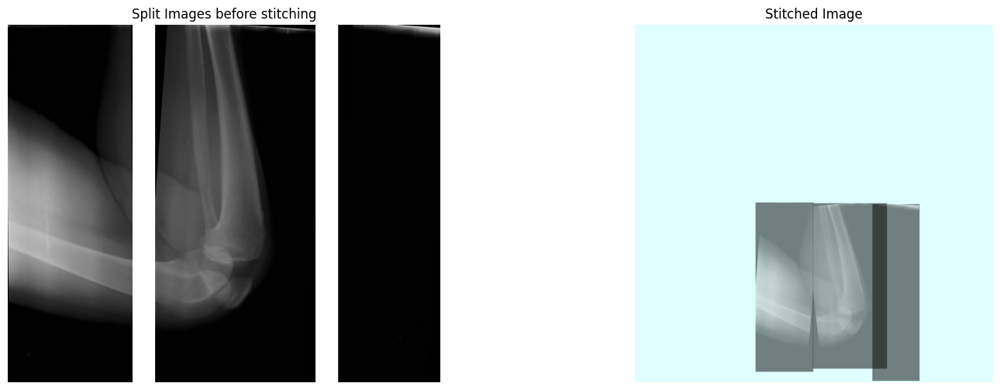

Trying to read original image from: /Users/rishabhdubey/Downloads/BothComplete/IMG0002671.jpg
Processing augmented set: 1_IMG0002671
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0002671_1.jpg
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0002671_2.jpg
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0002671_3.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step


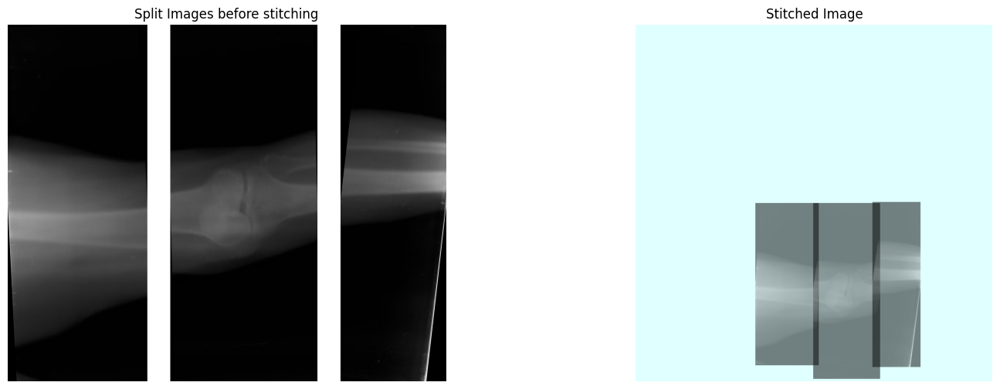

Trying to read original image from: /Users/rishabhdubey/Downloads/BothComplete/IMG0000258.jpg
Processing augmented set: 1_IMG0000258
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0000258_1.jpg
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0000258_2.jpg
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0000258_3.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step


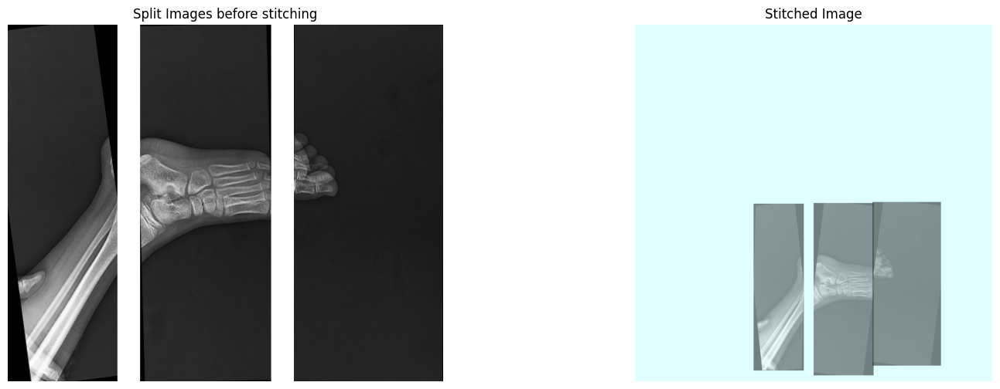

Trying to read original image from: /Users/rishabhdubey/Downloads/BothComplete/IMG0001420.jpg
Processing augmented set: 1_IMG0001420
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0001420_1.jpg
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0001420_2.jpg
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0001420_3.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step


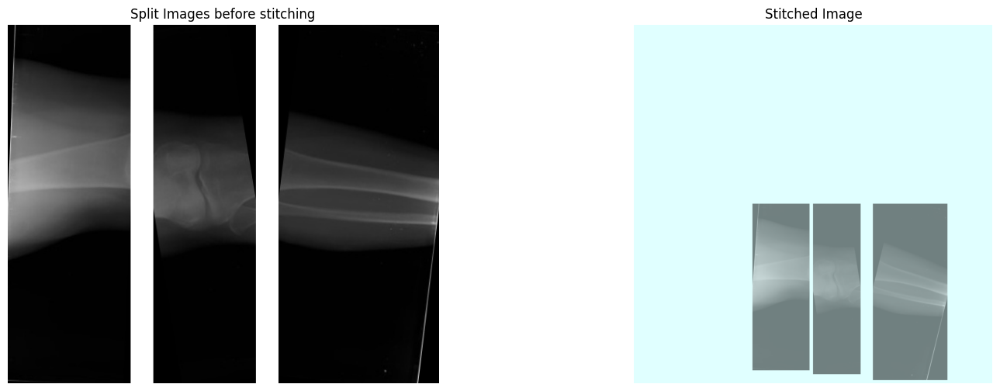

Trying to read original image from: /Users/rishabhdubey/Downloads/BothComplete/IMG0001030.jpg
Processing augmented set: 1_IMG0001030
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0001030_1.jpg
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0001030_2.jpg
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0001030_3.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step


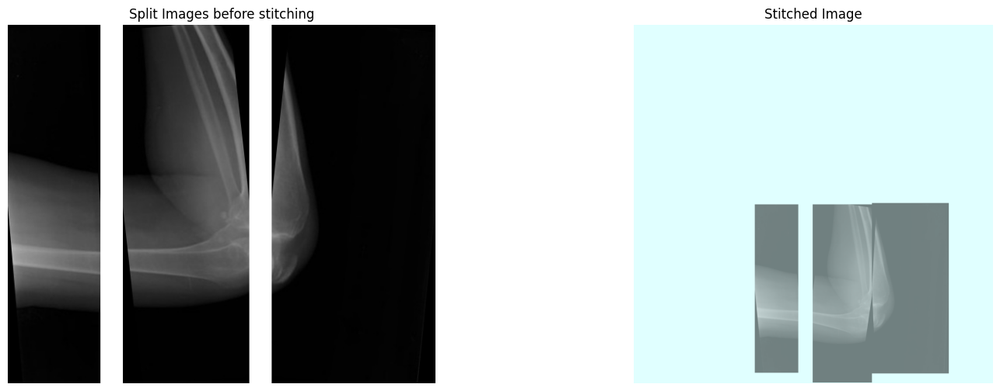

Trying to read original image from: /Users/rishabhdubey/Downloads/BothComplete/IMG0002074.jpg
Processing augmented set: 1_IMG0002074
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0002074_1.jpg
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0002074_2.jpg
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0002074_3.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step


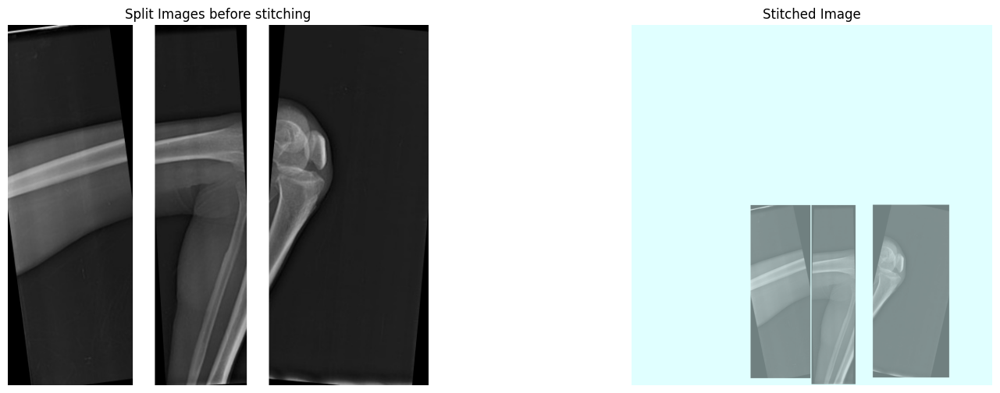

Trying to read original image from: /Users/rishabhdubey/Downloads/BothComplete/IMG0003752.jpg
Processing augmented set: 1_IMG0003752
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0003752_1.jpg
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0003752_2.jpg
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0003752_3.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step


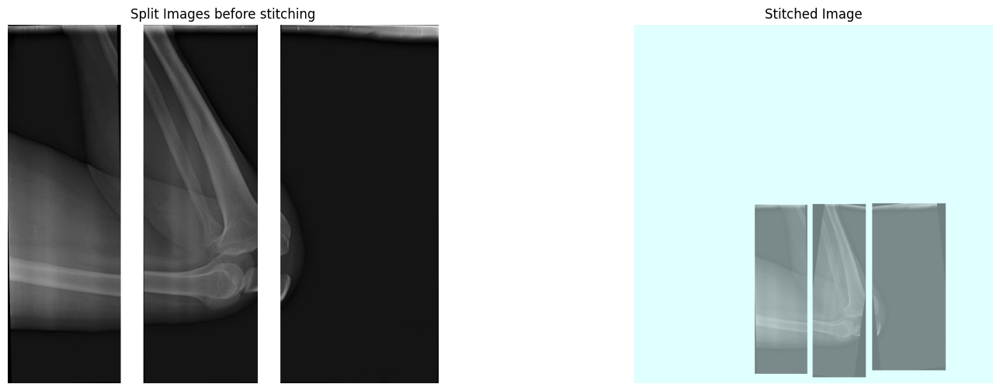

Trying to read original image from: /Users/rishabhdubey/Downloads/BothComplete/IMG0003583.jpg
Processing augmented set: 1_IMG0003583
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0003583_1.jpg
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0003583_2.jpg
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0003583_3.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step


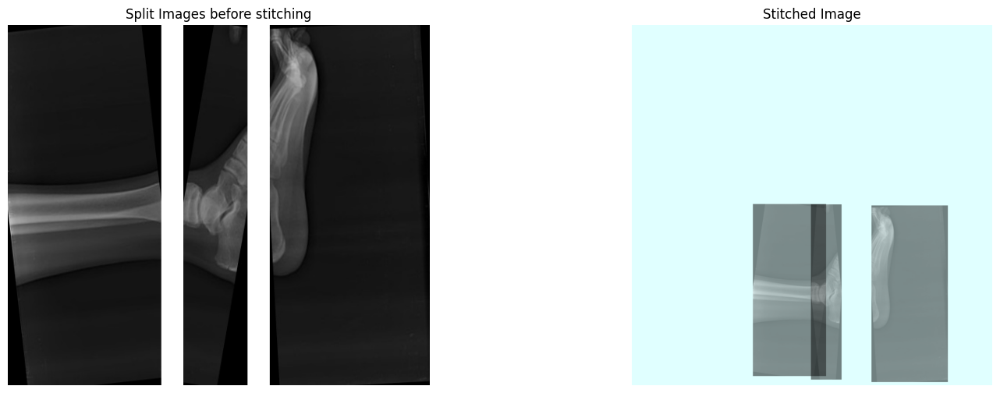

Trying to read original image from: /Users/rishabhdubey/Downloads/BothComplete/IMG0003582.jpg
Processing augmented set: 1_IMG0003582
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0003582_1.jpg
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0003582_2.jpg
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0003582_3.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step


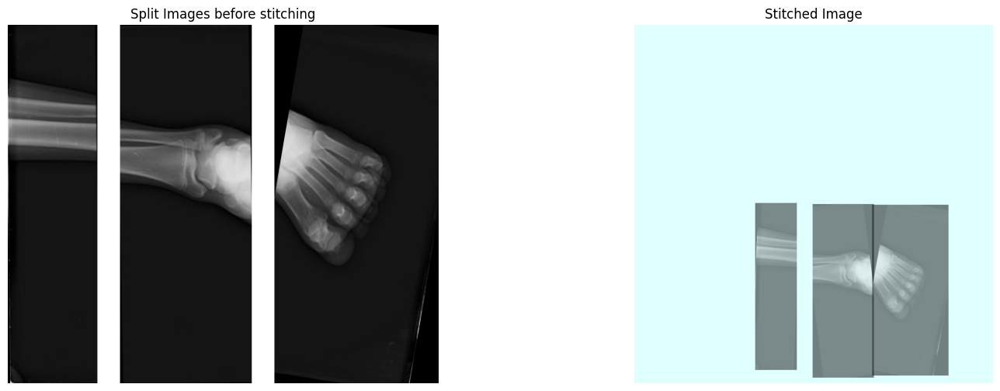

Trying to read original image from: /Users/rishabhdubey/Downloads/BothComplete/IMG0001815.jpg
Processing augmented set: 1_IMG0001815
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0001815_1.jpg
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0001815_2.jpg
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0001815_3.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step


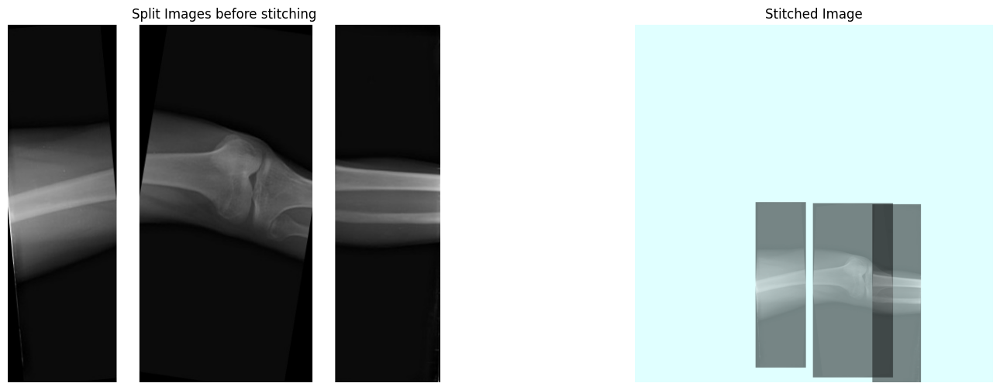

Trying to read original image from: /Users/rishabhdubey/Downloads/BothComplete/IMG0002307.jpg
Processing augmented set: 1_IMG0002307
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0002307_1.jpg
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0002307_2.jpg
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0002307_3.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step


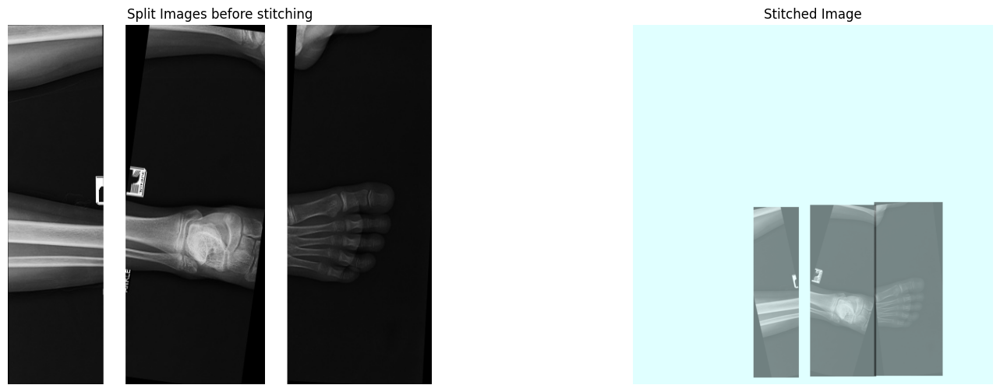

Trying to read original image from: /Users/rishabhdubey/Downloads/BothComplete/IMG0000506.jpg
Processing augmented set: 1_IMG0000506
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0000506_1.jpg
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0000506_2.jpg
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0000506_3.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step


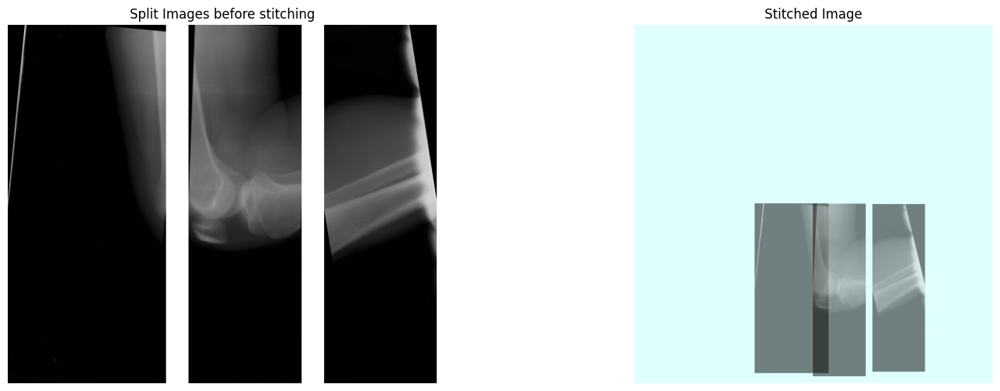

Trying to read original image from: /Users/rishabhdubey/Downloads/BothComplete/IMG0001816.jpg
Processing augmented set: 1_IMG0001816
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0001816_1.jpg
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0001816_2.jpg
Trying to read split image from: /Users/rishabhdubey/Downloads/Project/Additional_Synth_new_1_aug/1_IMG0001816_3.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step


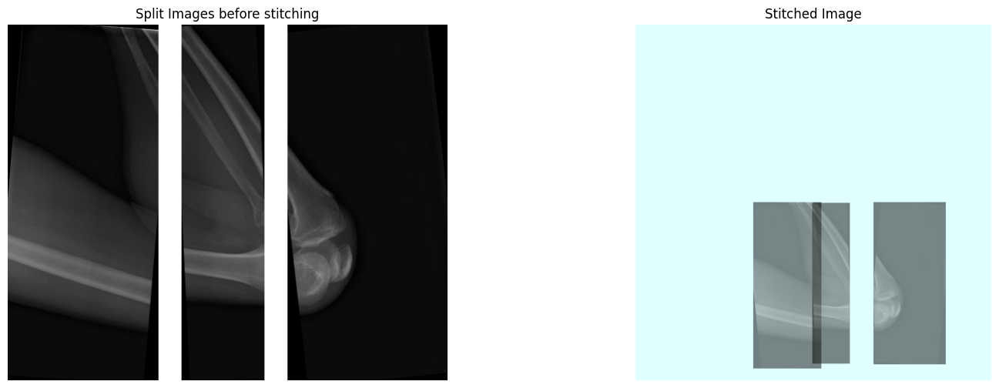

In [154]:
import os
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

def inverse_rotate_image(image, angle):
    height, width = image.shape[:2]
    center = (width // 2, height // 2)
    rotation_matrix = cv.getRotationMatrix2D(center, -angle, 1.0)  # Inverse rotation
    rotated_image = cv.warpAffine(image, rotation_matrix, (width, height), flags=cv.INTER_LINEAR)
    return rotated_image

def blend_images(base_image, overlay_image, x, y):
    """
    Blends overlay_image onto base_image at position (x, y).
    """
    h, w = overlay_image.shape[:2]
    
    # Ensure the placement is within the base image bounds
    if x < 0:
        overlay_image = overlay_image[:, -x:]
        x = 0
    if y < 0:
        overlay_image = overlay_image[-y:, :]
        y = 0
    if x + w > base_image.shape[1]:
        overlay_image = overlay_image[:, :base_image.shape[1] - x]
    if y + h > base_image.shape[0]:
        overlay_image = overlay_image[:base_image.shape[0] - y, :]
    
    h, w = overlay_image.shape[:2]

    # Blend the images in the overlapping area
    alpha = 0.5  # Blending factor
    base_image[y:y+h, x:x+w] = cv.addWeighted(base_image[y:y+h, x:x+w], alpha, overlay_image, alpha, 0)

def resize_images_to_min_height(images):
    """
    Resizes all images to the minimum height found among them.
    """
    min_height = min(img.shape[0] for img in images)
    resized_images = [cv.resize(img, (img.shape[1], min_height)) for img in images]
    return resized_images

def add_margin_between_images(images, margin=30, background_color=(255, 255, 255)):
    """
    Adds a margin between images when they are horizontally concatenated.
    
    Args:
    images: List of images to concatenate.
    margin: The size of the margin (in pixels) between each image.
    background_color: The color of the margin (default is white).

    Returns:
    A single image with the input images horizontally concatenated with margins in between.
    """
    if len(images) == 0:
        return None

    # Calculate the total width of the final image, including margins
    total_width = sum(img.shape[1] for img in images) + (len(images) - 1) * margin
    height = images[0].shape[0]
    
    # Create a blank canvas for the final image
    canvas = np.full((height, total_width, 3), background_color, dtype=np.uint8)

    # Paste images into the canvas with margins
    current_x = 0
    for img in images:
        canvas[:, current_x:current_x + img.shape[1]] = img
        current_x += img.shape[1] + margin
    
    return canvas

def create_stitched_image(augmented_filename, feature_vector, labels, original_folder, masked_synthetic_folder, max_nu_of_splits, model):
    # Extract base name by removing any prefix (e.g., "1_", "2_")
    # Split the filename to get the original image name
    base_name = '_'.join(augmented_filename.split('_')[1:])
    
    # Construct the path to the original image
    original_image_path = os.path.join(original_folder, base_name)
    print(f"Trying to read original image from: {original_image_path}")
    
    original_image = cv.imread(original_image_path)
    if original_image is None:
        print(f"Error: Could not read original image {base_name}")
        return

    # Only process the first augmented set ("1_imgname")
    augmented_base_name = f"1_{base_name.split('.')[0]}"
    print(f"Processing augmented set: {augmented_base_name}")

    # Get split images for this augmented set
    split_images = []
    for i in range(1, max_nu_of_splits + 1):
        split_image_path = os.path.join(masked_synthetic_folder, f"{augmented_base_name}_{i}.jpg")
        print(f"Trying to read split image from: {split_image_path}")

        if os.path.exists(split_image_path):
            split_image = cv.imread(split_image_path, cv.IMREAD_GRAYSCALE)
            if split_image is None:
                print(f"Error: Could not read split image {split_image_path}")
                continue
            split_images.append(split_image)
        else:
            print(f"Split image not found at path: {split_image_path}")
            break

    if len(split_images) < max_nu_of_splits:
        print(f"Error: Not enough split images for {augmented_base_name}")
        return

    # Predict coordinates and rotations
    predicted_values = model.predict(np.expand_dims(feature_vector, axis=0))[0]

    # Denormalize
    predicted_coordinates = predicted_values[:6] * 512
    predicted_rotations = predicted_values[6:] * 10

    # Calculate the average of predicted coordinates to adjust the canvas center
    avg_x = np.mean(predicted_coordinates[::2])
    avg_y = np.mean(predicted_coordinates[1::2])

    # Create a canvas of 1024x1024 with adjusted center and light yellow background
    canvas_size = 1024
    canvas_center_x = int(canvas_size // 2 - avg_x)
    canvas_center_y = int(canvas_size // 2 - avg_y)
    canvas = np.full((canvas_size, canvas_size, 3), (255, 255, 224), dtype=np.uint8)  # Light yellow background

    # Apply predicted transformations and stitch images onto the canvas
    for i in range(max_nu_of_splits):
        x = int(predicted_coordinates[2 * i]) + canvas_center_x
        y = int(predicted_coordinates[2 * i + 1]) + canvas_center_y
        angle = predicted_rotations[i]

        split_image = cv.cvtColor(split_images[i], cv.COLOR_GRAY2BGR)
        rotated_image = inverse_rotate_image(split_image, angle)

        blend_images(canvas, rotated_image, x, y)

    # Resize split images to the minimum height so they can be concatenated horizontally
    resized_split_images = resize_images_to_min_height(split_images)

    # Add a margin of 30 pixels between the split images
    non_overlapping_split_image = add_margin_between_images(
        [cv.cvtColor(img, cv.COLOR_GRAY2BGR) for img in resized_split_images], 
        margin=30, 
        background_color=(255, 255, 255)  # White margin
    )

    # Plot the split images on the left and the stitched image on the right
    fig, ax = plt.subplots(1, 2, figsize=(18, 6))  # Increase the width for better visibility

    ax[0].imshow(cv.cvtColor(non_overlapping_split_image, cv.COLOR_BGR2RGB))
    ax[0].set_title("Split Images before stitching")
    ax[0].axis('off')

    ax[1].imshow(cv.cvtColor(canvas, cv.COLOR_BGR2RGB))
    ax[1].set_title(f"Stitched Image")
    ax[1].axis('off')

    plt.show()

    
for idx, row in test1_df.iterrows():
    img_filename = row['imagename']  
    feature_vector = row['feature_vector']
    labels = row['labels']
    create_stitched_image(img_filename, feature_vector, labels, original_folder, masked_synthetic_folder, max_nu_of_splits, model)

